In [1]:
%matplotlib inline

import numpy as np
import copy
import matplotlib.pyplot as plt
import pickle
import random
import torch
from utils import torch_from_numpy
import datetime

from config import cfg_seed, cfg_env, cfg_z_dim
seed = cfg_seed


# bif_c = 0.1
num_iter_max=200000
# alpha=0.2
alpha=0.3
# alpha=0.5
# alpha=0.8 # predict diverge
# vae_lr=1e-5
vae_lr=5e-4
ratio_lr=5e-4
ratio_early=100
env_name = 'CustomPendulum-v0'
env_str=cfg_env
figfilenamehead = "fig_policy_optimization_"+env_str+"_iter1_"

loss_list = []
normalized_loss_list = []

In [2]:
import gym
import custom_gym
env = gym.make(env_name)

np.random.seed(seed)
random.seed(seed)
env.seed(seed)
env.action_space.seed(seed)
torch.manual_seed(seed)

s_dim = env.reset().flatten().shape[0]
a_dim = env.action_space.sample().flatten().shape[0]
z_dim = cfg_z_dim
print(s_dim, a_dim, z_dim)



c = 0.21455680991172585
2 1 1


/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/core.py:329: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:174: UserWarning: WARN: Future gym versions will require that `Env.reset` can be passed a `seed` instead of using `Env.seed` for resetting the environment random number generator.
  logger.warn(
/home/proxima-hishinuma/anaconda3/

In [3]:


from sac import SAC
# agent = SAC(env.observation_space.shape[0], env.action_space)
agent = SAC(env.observation_space.shape[0]+z_dim*2, env.action_space)
agent.load_checkpoint(ckpt_path="checkpoints/sac_checkpoint_custom_"+env_str+"_bamdp_standardvae_")


offline_data = pickle.load(open("offline_data_"+env_str+".pkl","rb"))
debug_info = pickle.load(open("offline_data_debug_info_"+env_str+".pkl","rb"))
debug_info = np.array(debug_info)

Loading models from checkpoints/sac_checkpoint_custom_pendulum_bamdp_standardvae_


In [4]:
args_init_dict = {
    "offline_data": offline_data,
    "s_dim": s_dim,
    "a_dim": a_dim,
    "z_dim": z_dim,
    #              "policy":agent.select_action,
    "mdp_policy":None,
    "bamdp_policy":agent.policy.my_np_select_action,
    "debug_info":debug_info,
    "env" : env,
    "ckpt_suffix" : env_str
}
# import vi_base
# vi = vi_base.baseVI(args_init_dict)
import vi_iw
iwvi = vi_iw.iwVI(args_init_dict)

iwvi.load_base()
# iwvi.update_mulogvar_offlinedata()

base load ckpt ckpt_basevi_pendulum_unweighted


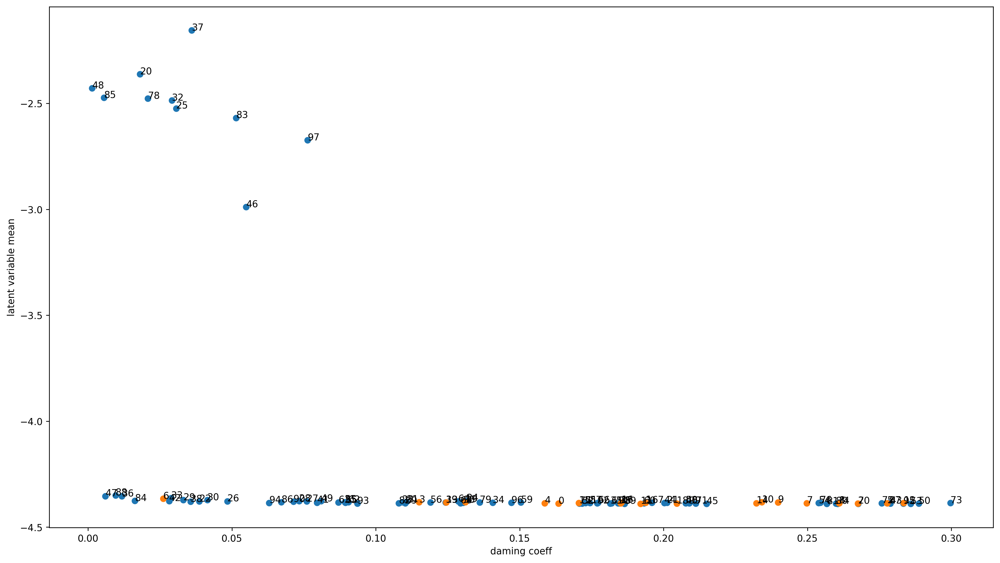

[0.16346495 0.19376823 0.2675319  0.11503246 0.15866848 0.27767899
 0.02613879 0.24978595 0.26100364 0.23974757]
[0.23415875 0.19197631 0.28340068 0.12439858 0.23227011 0.17053018
 0.18529065 0.1850802  0.20454609 0.13110959]
[0.01806764 0.20119136 0.03867789 0.10911323 0.13158045 0.03061344
 0.04839286 0.07598748 0.07332768 0.03311254]
[0.04145489 0.11061755 0.02913038 0.02882952 0.14059536 0.18145366
 0.01175634 0.03605897 0.03561832 0.1242789 ]
[0.20774164 0.07961685 0.02818215 0.27878886 0.20022311 0.21489816
 0.05495741 0.00603226 0.00140864 0.08100239]
[0.28865656 0.1728472  0.17167557 0.2858247  0.2539226  0.08923109
 0.11895172 0.17438186 0.20775948 0.15039731]
[0.19319706 0.18191796 0.09047245 0.08702328 0.12863061 0.0894847
 0.17726183 0.19596025 0.12942553 0.11026856]
[0.26757701 0.21116658 0.27584478 0.2996541  0.26043782 0.18466787
 0.25440247 0.17073022 0.0207501  0.1360628 ]
[0.2599147  0.256741   0.10799342 0.0514889  0.0163014  0.00555654
 0.06717741 0.27842439 0.00955

In [5]:
plt.figure(figsize=(18,10), dpi=250)
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()
plt.xlabel("daming coeff")
plt.ylabel("latent variable mean")

plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.xlim([-0.05,0.35])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_"+env_str+"_iter0.png")
plt.savefig(figfilenamehead+"damping_latent_"+env_str+"_iter0.eps")
# plt.savefig(figfilenamehead+"damping_latent_"+env_str+"_iter0.pdf")
plt.show()

# plt.figure(figsize=(16,12))
# plt.xlim([0.06,0.14])
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [6]:
iwvi.get_real_rollout_bamdppolicy_data()


 0 2.86102294921875e-06
c = 0.16346495489906906


/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:227: DeprecationWarning: WARN: Core environment is written in old step API which returns one bool instead of two. It is recommended to rewrite the environment with new step API. 
  logger.deprecation(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(done, (bool, np.bool8)):
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:141: UserWarning: WARN: The obs returned by the `step()` method was expecting numpy array dtype to be float32, actual type: float64
  logger.warn(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:165: UserWarning: WARN: The obs returned by the `step()` method is not within the observ


 1 6.414030075073242
c = 0.23286345254101984

 2 4.555261850357056
c = 0.26847837409168523

 3 4.18208646774292
c = 0.04299902432010615

 4 4.348509311676025
c = 0.09351758694205982

 5 4.278110027313232
c = 0.29600376674243084

 6 4.366180419921875
c = 0.13926473190164132

 7 4.307207345962524
c = 0.009149517587861955

 8 4.068111419677734
c = 0.29594157954903033

 9 4.179453611373901
c = 0.026047803484552465

 10 4.288186073303223
c = 0.13050031342134485

 11 4.305948972702026
c = 0.2942131645589285

 12 4.148204326629639
c = 0.20960920437501504

 13 4.303545236587524
c = 0.011611393747099852

 14 4.0961339473724365
c = 0.124189932793927

 15 4.067246913909912
c = 0.2913070358269199

 16 4.175381422042847
c = 0.12825557098102536

 17 4.276267766952515
c = 0.18927181968161286

 18 4.181588411331177
c = 0.2692102384069762

 19 4.208874225616455
c = 0.09872431791554087

 20 4.199233531951904
c = 0.1270779733245952

 21 4.26644492149353
c = 0.17110815579866848

 22 4.168227910995483
c =

In [7]:
# fig = plt.figure(figsize=(18,10))
# ax_list = []
# for i in range(50):
#     ax_list.append(fig.add_subplot(5, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1]) 
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1]) 
# print("オフラインデータvs実環境方策rollout")


 0 7.152557373046875e-07
c = 0.04988471138272022

 1 4.217923164367676
c = 0.29896905376368954

 2 4.0610575675964355
c = 0.019334754787530006

 3 4.184276819229126
c = 0.22627071526002945

 4 4.128656387329102
c = 0.053360907520835034

 5 4.218623399734497
c = 0.11656016988839336

 6 4.1453187465667725
c = 0.05672321851742609

 7 4.134468078613281
c = 0.010959088590663824

 8 4.165777921676636
c = 0.281507703526519

 9 4.100779294967651
c = 0.11159597966644999

 10 4.151989936828613
c = 0.15426433224955613

 11 3.7852742671966553
c = 0.06861758179199702

 12 4.351012468338013
c = 0.025057399648153855

 13 4.189838647842407
c = 0.19410055097672865

 14 4.095289945602417
c = 0.17748853812975604

 15 4.155359745025635
c = 0.02369327384395885

 16 4.175258636474609
c = 0.14298462297799133

 17 4.082383632659912
c = 0.2981552493356594

 18 4.138486623764038
c = 0.033801012348337996

 19 4.130378246307373
c = 0.03158896125912567

 20 4.19365119934082
c = 0.25993081017229813

 21 4.16365599


 75 4.162697076797485
c = 0.08035594427404363

 76 4.085869073867798
c = 0.02014936101796446

 77 4.012348413467407
c = 0.07599058604267007

 78 3.9658217430114746
c = 0.21377655075608262

 79 4.10919976234436
c = 0.22915797934681453

 80 4.106491804122925
c = 0.08773081860811625

 81 4.114348649978638
c = 0.0749737581034073

 82 4.068058490753174
c = 0.18267126747879572

 83 3.994760036468506
c = 0.24364500358448207

 84 4.1733129024505615
c = 0.1521365883058035

 85 4.0224363803863525
c = 0.22285553710375347

 86 4.11647629737854
c = 0.2001463253904252

 87 4.124237537384033
c = 0.03100889901004118

 88 4.094754457473755
c = 0.25833483872425717

 89 4.006868362426758
c = 0.01142629352016089

 90 4.016836404800415
c = 0.02297618050008542

 91 3.922419309616089
c = 0.10944554016199037

 92 4.028016567230225
c = 0.05103287940291244

 93 4.056899070739746
c = 0.12506249449005877

 94 3.9782345294952393
c = 0.0448739905482401

 95 4.041724920272827
c = 0.062304727747746556

 96 4.1753642

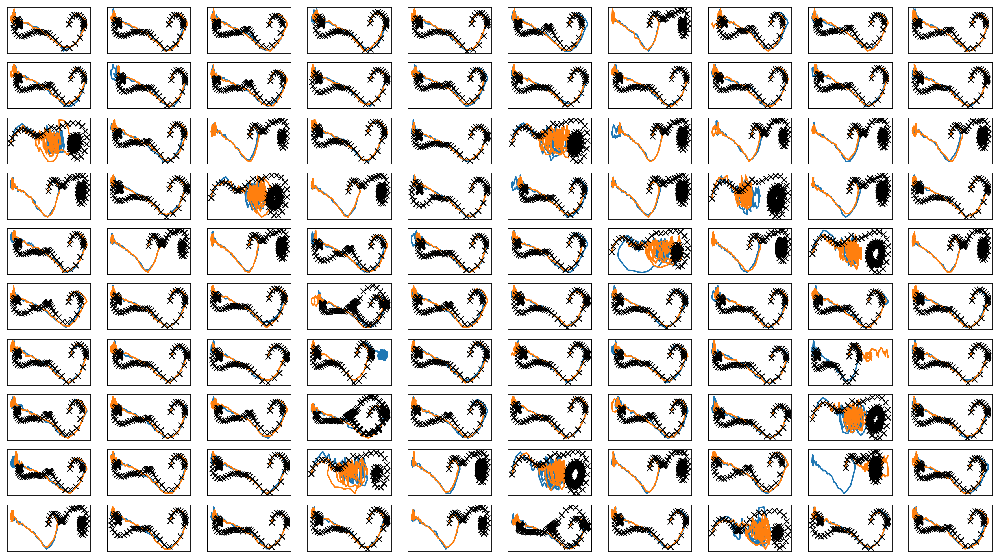

In [8]:
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
# simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
#     ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"iter0.png")
# plt.savefig(figfilenamehead+"iter0.pdf")
plt.savefig(figfilenamehead+"iter0.eps")
print("実環境方策rollout vs Sim環境方策rollout")

In [9]:
print(datetime.datetime.now())

2023-04-19 16:29:15.132456


# Iter 1

In [10]:
iwvi.get_sim_rollout_bamdppolicy_data_randomstop()


 0
c = 0.07659115209724743
c = 0.26320504710412856
c = 0.057570211538805455
c = 0.05314979231460859
c = 0.01577601187617651
c = 0.0343548816687315
c = 0.2448979075945859
c = 0.2044564224830193

 1
c = 0.06755909504490039
c = 0.10212620333819986
c = 0.18714465837277425
c = 0.0018651433305944543
c = 0.07778136176321832
c = 0.06853082291392831
c = 0.1507907894274156

 2
c = 0.04179471568407809
c = 0.16021783436860945
c = 0.18764067590480824
c = 0.003620328616930868
c = 0.0020521029554442572
c = 0.17812256327551054
c = 0.14017358250825804
c = 0.01152858396461598
c = 0.25962587590150915
c = 0.27429191471324743
c = 0.2353914304407367

 3
c = 0.29873884698507924
c = 0.015587076861978078
c = 0.016731148942064844
c = 0.23844834470295517
c = 0.20604863852622993
c = 0.15650298592651543
c = 0.1421041297945675
c = 0.11712515794480738
c = 0.23087918671778646
c = 0.01750414047384502
c = 0.18569594444190807

 4
c = 0.18608563949045162
c = 0.04072617092047449
c = 0.056742641251075726
c = 0.14380008980

c = 0.057050874677685756
c = 0.05958078521699339

 26
c = 0.15363514940644474
c = 0.047033664751089645
c = 0.049248362260529366
c = 0.21581844927418678
c = 0.13353747977064084
c = 0.21840953087332912
c = 0.022017332431999114
c = 0.047424092391206686
c = 0.20053412162120943
c = 0.1960325861726267
c = 0.14596969761728137

 27
c = 0.24131971855522294
c = 0.10079872016763876
c = 0.06554231587933218
c = 0.12481341554098854
c = 0.27829122406130435
c = 0.11015093219632456
c = 0.1163718915373818
c = 0.2855362032428589
c = 0.0710250559752233
c = 0.03946981862598368
c = 0.09123673119317
c = 0.00985298347210245
c = 0.06777921697759984
c = 0.044224410814095595
c = 0.027705367177599836
c = 0.10525199457270926

 28
c = 0.11687779728366354
c = 0.2143273583584265
c = 0.1703449831964329
c = 0.039257667153352216
c = 0.1534251107271577
c = 0.14201134322243208
c = 0.08190790963076842
c = 0.02472744367823464
c = 0.25550511004253385
c = 0.2532907218287792
c = 0.1513728609665874
c = 0.18980691092535937
c = 0

c = 0.15900577267735308
c = 0.05328997193646829
c = 0.21205895199411917
c = 0.06707801642993887
c = 0.11055446321665714
c = 0.03934011008809267
c = 0.049739422721151526
c = 0.12928763270947388
c = 0.24920186321145407
c = 0.08191210819416997
c = 0.16527583706370683

 54
c = 0.1610388334724003
c = 0.06867492056720971
c = 0.14577619215684567
c = 0.12688568673247952
c = 0.2582743225661662
c = 0.2081639395240225
c = 0.1707109155719291
c = 0.22770138733166448
c = 0.20188057882526222
c = 0.18824915873218637
c = 0.021710884454051203
c = 0.06180564132359748
c = 0.2997579087922191
c = 0.04245335991270718

 55
c = 0.22891719033741165
c = 0.15153202600268217
c = 0.13161902183647833
c = 0.06631086265005089
c = 0.25340427589835324
c = 0.059788812236577026
c = 0.29556041158465873
c = 0.27242288144470544
c = 0.18381685731868672
c = 0.22395025176038272
c = 0.059600088779955714
c = 0.18643376196032424
c = 0.10162777333565892

 56
c = 0.061181790240002226
c = 0.09176803995936296
c = 0.23061767887002932
c

c = 0.11813001415302926
c = 0.0638855435665824

 81
c = 0.29121976251575304
c = 0.08436444079531415
c = 0.15102073011001144
c = 0.1943969634830426
c = 0.2956981501687569
c = 0.020252660136872245
c = 0.2461858014702024
c = 0.2925123629779969
c = 0.2154963144816569
c = 0.15698697725297361
c = 0.22368877507310259
c = 0.062112363771215616
c = 0.033024705630932634

 82
c = 0.16378603871051947
c = 0.023764655561453064
c = 0.03962434092850119
c = 0.27943801805447993
c = 0.205269259378566
c = 0.1933977742645476
c = 0.14137694488986538
c = 0.19732354980260858
c = 0.13185617479077302
c = 0.11863989039033677
c = 0.2700102058082162
c = 0.23870521792667945

 83
c = 0.2552681847887546
c = 0.09360055960539766
c = 0.2571473018123933
c = 0.09970551144361
c = 0.1943860767677436
c = 0.1631627586840924
c = 0.2129752922191627
c = 0.16117196339411732

 84
c = 0.21818942335384303
c = 0.19675577646250617
c = 0.12854102687868724
c = 0.22676890279514225
c = 0.2751455606187548
c = 0.10810620338633213
c = 0.19631

In [11]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
# iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)


train: iter 0  trainloss 1.32047  validloss 1.43581±0.00000  bestvalidloss 1.43581  last_update 0
train: iter 1  trainloss 1.00290  validloss 1.17220±0.00000  bestvalidloss 1.17220  last_update 0
train: iter 2  trainloss 0.69151  validloss 0.74646±0.00000  bestvalidloss 0.74646  last_update 0
train: iter 3  trainloss 0.54702  validloss 0.46438±0.00000  bestvalidloss 0.46438  last_update 0
train: iter 4  trainloss 0.50179  validloss 0.37308±0.00000  bestvalidloss 0.37308  last_update 0
train: iter 5  trainloss 0.47600  validloss 0.34267±0.00000  bestvalidloss 0.34267  last_update 0
train: iter 6  trainloss 0.46226  validloss 0.32176±0.00000  bestvalidloss 0.32176  last_update 0
train: iter 7  trainloss 0.45399  validloss 0.30454±0.00000  bestvalidloss 0.30454  last_update 0
train: iter 8  trainloss 0.43962  validloss 0.29164±0.00000  bestvalidloss 0.29164  last_update 0
train: iter 9  trainloss 0.43770  validloss 0.28218±0.00000  bestvalidloss 0.28218  last_update 0
train: iter 10  trai

train: iter 83  trainloss 0.24656  validloss 0.17712±0.00000  bestvalidloss 0.17347  last_update 4
train: iter 84  trainloss 0.24954  validloss 0.18083±0.00000  bestvalidloss 0.17347  last_update 5
train: iter 85  trainloss 0.24386  validloss 0.17502±0.00000  bestvalidloss 0.17347  last_update 6
train: iter 86  trainloss 0.24697  validloss 0.17743±0.00000  bestvalidloss 0.17347  last_update 7
train: iter 87  trainloss 0.23954  validloss 0.17468±0.00000  bestvalidloss 0.17347  last_update 8
train: iter 88  trainloss 0.24741  validloss 0.17823±0.00000  bestvalidloss 0.17347  last_update 9
train: iter 89  trainloss 0.23885  validloss 0.17314±0.00000  bestvalidloss 0.17314  last_update 0
train: iter 90  trainloss 0.24821  validloss 0.17186±0.00000  bestvalidloss 0.17186  last_update 0
train: iter 91  trainloss 0.24171  validloss 0.17203±0.00000  bestvalidloss 0.17186  last_update 1
train: iter 92  trainloss 0.23997  validloss 0.17057±0.00000  bestvalidloss 0.17057  last_update 0
train: ite

train: iter 165  trainloss 0.22000  validloss 0.17117±0.00000  bestvalidloss 0.15997  last_update 3
train: iter 166  trainloss 0.22086  validloss 0.16120±0.00000  bestvalidloss 0.15997  last_update 4
train: iter 167  trainloss 0.22035  validloss 0.16731±0.00000  bestvalidloss 0.15997  last_update 5
train: iter 168  trainloss 0.22205  validloss 0.15868±0.00000  bestvalidloss 0.15868  last_update 0
train: iter 169  trainloss 0.22474  validloss 0.16673±0.00000  bestvalidloss 0.15868  last_update 1
train: iter 170  trainloss 0.22273  validloss 0.17778±0.00000  bestvalidloss 0.15868  last_update 2
train: iter 171  trainloss 0.22153  validloss 0.16483±0.00000  bestvalidloss 0.15868  last_update 3
train: iter 172  trainloss 0.22658  validloss 0.16072±0.00000  bestvalidloss 0.15868  last_update 4
train: iter 173  trainloss 0.22176  validloss 0.16075±0.00000  bestvalidloss 0.15868  last_update 5
train: iter 174  trainloss 0.21815  validloss 0.17264±0.00000  bestvalidloss 0.15868  last_update 6


train: iter 247  trainloss 0.20605  validloss 0.15728±0.00000  bestvalidloss 0.15313  last_update 9
train: iter 248  trainloss 0.20625  validloss 0.15254±0.00000  bestvalidloss 0.15254  last_update 0
train: iter 249  trainloss 0.20563  validloss 0.15524±0.00000  bestvalidloss 0.15254  last_update 1
train: iter 250  trainloss 0.21033  validloss 0.15726±0.00000  bestvalidloss 0.15254  last_update 2
train: iter 251  trainloss 0.20797  validloss 0.15393±0.00000  bestvalidloss 0.15254  last_update 3
train: iter 252  trainloss 0.20718  validloss 0.15831±0.00000  bestvalidloss 0.15254  last_update 4
train: iter 253  trainloss 0.20747  validloss 0.15195±0.00000  bestvalidloss 0.15195  last_update 0
train: iter 254  trainloss 0.20494  validloss 0.16611±0.00000  bestvalidloss 0.15195  last_update 1
train: iter 255  trainloss 0.21106  validloss 0.15251±0.00000  bestvalidloss 0.15195  last_update 2
train: iter 256  trainloss 0.20944  validloss 0.15195±0.00000  bestvalidloss 0.15195  last_update 0


train: iter 329  trainloss 0.20054  validloss 0.14845±0.00000  bestvalidloss 0.14457  last_update 15
train: iter 330  trainloss 0.19673  validloss 0.14522±0.00000  bestvalidloss 0.14457  last_update 16
train: iter 331  trainloss 0.19361  validloss 0.15342±0.00000  bestvalidloss 0.14457  last_update 17
train: iter 332  trainloss 0.20433  validloss 0.14326±0.00000  bestvalidloss 0.14326  last_update 0
train: iter 333  trainloss 0.19605  validloss 0.14620±0.00000  bestvalidloss 0.14326  last_update 1
train: iter 334  trainloss 0.19714  validloss 0.15185±0.00000  bestvalidloss 0.14326  last_update 2
train: iter 335  trainloss 0.20040  validloss 0.14997±0.00000  bestvalidloss 0.14326  last_update 3
train: iter 336  trainloss 0.21814  validloss 0.19388±0.00000  bestvalidloss 0.14326  last_update 4
train: iter 337  trainloss 0.20009  validloss 0.14747±0.00000  bestvalidloss 0.14326  last_update 5
train: iter 338  trainloss 0.19637  validloss 0.15158±0.00000  bestvalidloss 0.14326  last_update

train: iter 411  trainloss 0.18766  validloss 0.13865±0.00000  bestvalidloss 0.13821  last_update 4
train: iter 412  trainloss 0.18989  validloss 0.15454±0.00000  bestvalidloss 0.13821  last_update 5
train: iter 413  trainloss 0.18773  validloss 0.14404±0.00000  bestvalidloss 0.13821  last_update 6
train: iter 414  trainloss 0.19036  validloss 0.14483±0.00000  bestvalidloss 0.13821  last_update 7
train: iter 415  trainloss 0.21622  validloss 0.14135±0.00000  bestvalidloss 0.13821  last_update 8
train: iter 416  trainloss 0.19058  validloss 0.14219±0.00000  bestvalidloss 0.13821  last_update 9
train: iter 417  trainloss 0.18975  validloss 0.14460±0.00000  bestvalidloss 0.13821  last_update 10
train: iter 418  trainloss 0.18762  validloss 0.16511±0.00000  bestvalidloss 0.13821  last_update 11
train: iter 419  trainloss 0.18501  validloss 0.13777±0.00000  bestvalidloss 0.13777  last_update 0
train: iter 420  trainloss 0.18714  validloss 0.14375±0.00000  bestvalidloss 0.13777  last_update 

train: iter 493  trainloss 0.18055  validloss 0.14403±0.00000  bestvalidloss 0.13529  last_update 32
train: iter 494  trainloss 0.18232  validloss 0.14893±0.00000  bestvalidloss 0.13529  last_update 33
train: iter 495  trainloss 0.18163  validloss 0.13566±0.00000  bestvalidloss 0.13529  last_update 34
train: iter 496  trainloss 0.18093  validloss 0.14126±0.00000  bestvalidloss 0.13529  last_update 35
train: iter 497  trainloss 0.18246  validloss 0.13713±0.00000  bestvalidloss 0.13529  last_update 36
train: iter 498  trainloss 0.18128  validloss 0.14016±0.00000  bestvalidloss 0.13529  last_update 37
train: iter 499  trainloss 0.18205  validloss 0.13769±0.00000  bestvalidloss 0.13529  last_update 38
train: iter 500  trainloss 0.18015  validloss 0.13642±0.00000  bestvalidloss 0.13529  last_update 39
train: iter 501  trainloss 0.18330  validloss 0.13826±0.00000  bestvalidloss 0.13529  last_update 40
train: iter 502  trainloss 0.18258  validloss 0.13843±0.00000  bestvalidloss 0.13529  last_

train: iter 575  trainloss 0.17772  validloss 0.13525±0.00000  bestvalidloss 0.13176  last_update 24
train: iter 576  trainloss 0.17862  validloss 0.13307±0.00000  bestvalidloss 0.13176  last_update 25
train: iter 577  trainloss 0.17701  validloss 0.13816±0.00000  bestvalidloss 0.13176  last_update 26
train: iter 578  trainloss 0.17693  validloss 0.13784±0.00000  bestvalidloss 0.13176  last_update 27
train: iter 579  trainloss 0.18112  validloss 0.13678±0.00000  bestvalidloss 0.13176  last_update 28
train: iter 580  trainloss 0.17848  validloss 0.13658±0.00000  bestvalidloss 0.13176  last_update 29
train: iter 581  trainloss 0.17600  validloss 0.13652±0.00000  bestvalidloss 0.13176  last_update 30
train: iter 582  trainloss 0.17985  validloss 0.13699±0.00000  bestvalidloss 0.13176  last_update 31
train: iter 583  trainloss 0.17467  validloss 0.13293±0.00000  bestvalidloss 0.13176  last_update 32
train: iter 584  trainloss 0.17495  validloss 0.13710±0.00000  bestvalidloss 0.13176  last_

train: iter 657  trainloss 0.17285  validloss 0.13467±0.00000  bestvalidloss 0.12882  last_update 20
train: iter 658  trainloss 0.17518  validloss 0.13128±0.00000  bestvalidloss 0.12882  last_update 21
train: iter 659  trainloss 0.17477  validloss 0.13059±0.00000  bestvalidloss 0.12882  last_update 22
train: iter 660  trainloss 0.17405  validloss 0.13418±0.00000  bestvalidloss 0.12882  last_update 23
train: iter 661  trainloss 0.17355  validloss 0.13181±0.00000  bestvalidloss 0.12882  last_update 24
train: iter 662  trainloss 0.17137  validloss 0.13024±0.00000  bestvalidloss 0.12882  last_update 25
train: iter 663  trainloss 0.17173  validloss 0.13273±0.00000  bestvalidloss 0.12882  last_update 26
train: iter 664  trainloss 0.17579  validloss 0.13201±0.00000  bestvalidloss 0.12882  last_update 27
train: iter 665  trainloss 0.17625  validloss 0.13711±0.00000  bestvalidloss 0.12882  last_update 28
train: iter 666  trainloss 0.17553  validloss 0.13099±0.00000  bestvalidloss 0.12882  last_

train: iter 739  trainloss 0.16704  validloss 0.13397±0.00000  bestvalidloss 0.12706  last_update 38
train: iter 740  trainloss 0.16795  validloss 0.13308±0.00000  bestvalidloss 0.12706  last_update 39
train: iter 741  trainloss 0.17040  validloss 0.13303±0.00000  bestvalidloss 0.12706  last_update 40
train: iter 742  trainloss 0.16896  validloss 0.12867±0.00000  bestvalidloss 0.12706  last_update 41
train: iter 743  trainloss 0.16932  validloss 0.12813±0.00000  bestvalidloss 0.12706  last_update 42
train: iter 744  trainloss 0.16846  validloss 0.13003±0.00000  bestvalidloss 0.12706  last_update 43
train: iter 745  trainloss 0.16863  validloss 0.12970±0.00000  bestvalidloss 0.12706  last_update 44
train: iter 746  trainloss 0.16910  validloss 0.12833±0.00000  bestvalidloss 0.12706  last_update 45
train: iter 747  trainloss 0.16952  validloss 0.13004±0.00000  bestvalidloss 0.12706  last_update 46
train: iter 748  trainloss 0.17021  validloss 0.13130±0.00000  bestvalidloss 0.12706  last_

train: iter 821  trainloss 0.16501  validloss 0.12885±0.00000  bestvalidloss 0.12479  last_update 53
train: iter 822  trainloss 0.16674  validloss 0.13001±0.00000  bestvalidloss 0.12479  last_update 54
train: iter 823  trainloss 0.16686  validloss 0.12879±0.00000  bestvalidloss 0.12479  last_update 55
train: iter 824  trainloss 0.16618  validloss 0.12780±0.00000  bestvalidloss 0.12479  last_update 56
train: iter 825  trainloss 0.16454  validloss 0.13868±0.00000  bestvalidloss 0.12479  last_update 57
train: iter 826  trainloss 0.16450  validloss 0.12796±0.00000  bestvalidloss 0.12479  last_update 58
train: iter 827  trainloss 0.16488  validloss 0.13952±0.00000  bestvalidloss 0.12479  last_update 59
train: iter 828  trainloss 0.16600  validloss 0.13909±0.00000  bestvalidloss 0.12479  last_update 60
train: iter 829  trainloss 0.16956  validloss 0.13501±0.00000  bestvalidloss 0.12479  last_update 61
train: iter 830  trainloss 0.16558  validloss 0.12712±0.00000  bestvalidloss 0.12479  last_

([1.3204706594347955,
  1.00289705991745,
  0.6915131703019142,
  0.5470218099653721,
  0.5017914133146405,
  0.47600355967879293,
  0.4622593617066741,
  0.453989371843636,
  0.43961585965007544,
  0.4377047147601843,
  0.42244523894041774,
  0.41614265087991953,
  0.40824215319007634,
  0.40370017644017936,
  0.39731592666357757,
  0.3906192645430565,
  0.38614900782704353,
  0.3824898857623339,
  0.3774781541898847,
  0.37324918564409015,
  0.3671650990843773,
  0.3632094692438841,
  0.3594912137836218,
  0.35478148721158503,
  0.34313241206109524,
  0.3336108071729541,
  0.32411561962217095,
  0.31514941677451136,
  0.31362302098423245,
  0.30882629975676534,
  0.3042685604654253,
  0.3052602275274694,
  0.29618670865893365,
  0.2985847624950111,
  0.2921704937703907,
  0.2910470954142511,
  0.28826113948598503,
  0.2858253879472613,
  0.28355275485664605,
  0.294853432290256,
  0.28380403891205785,
  0.28182279216125605,
  0.2760918913409114,
  0.2742497612722218,
  0.272043148521

In [12]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


train_loss:  -102.61530972719193
valid_loss:  -62.50853362083435
train_loss:  -121.39819359123707
valid_loss:  -119.78676910400391


1e-08 1000.0


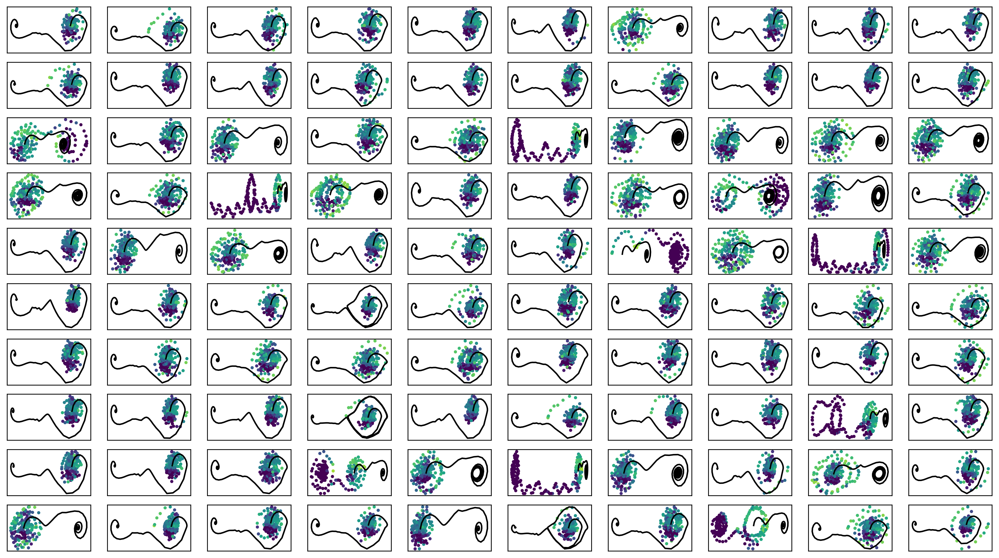

In [13]:

def f(x):
#     return x
    return np.log10(x)

fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter1.png")

In [14]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
# #     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [15]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
# #     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [16]:
# for i in range(100):
#     print(i, " ", end="")
#     fig = plt.figure(figsize=(16,10), dpi=150)
#     fig.patch.set_facecolor('white')
#     plt.plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     plt.plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     plt.scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()),
#                vmin=-8, vmax=3
#                )
#     plt.colorbar()
#     plt.savefig("ratio"+str(i)+".png")
#     plt.close()

train_weighted_vae: enc_dec
train: iter 0  trainloss -110.63099  validloss -120.26326±0.00000  bestvalidloss -120.26326  last_update 0
train: iter 1  trainloss -115.52072  validloss -114.86387±0.00000  bestvalidloss -120.26326  last_update 1
train: iter 2  trainloss -128.18121  validloss -124.38322±0.00000  bestvalidloss -124.38322  last_update 0
train: iter 3  trainloss -125.67905  validloss -117.74257±0.00000  bestvalidloss -124.38322  last_update 1
train: iter 4  trainloss -133.02917  validloss -106.56210±0.00000  bestvalidloss -124.38322  last_update 2
train: iter 5  trainloss -119.80335  validloss -125.75367±0.00000  bestvalidloss -125.75367  last_update 0
train: iter 6  trainloss -132.77635  validloss -127.00524±0.00000  bestvalidloss -127.00524  last_update 0
train: iter 7  trainloss -132.16675  validloss -130.30595±0.00000  bestvalidloss -130.30595  last_update 0
train: iter 8  trainloss -136.51843  validloss -134.31348±0.00000  bestvalidloss -134.31348  last_update 0
train: it

train: iter 76  trainloss -192.76350  validloss -195.33625±0.00000  bestvalidloss -204.56638  last_update 1
train: iter 77  trainloss -199.18142  validloss -209.36253±0.00000  bestvalidloss -209.36253  last_update 0
train: iter 78  trainloss -200.37014  validloss -206.08538±0.00000  bestvalidloss -209.36253  last_update 1
train: iter 79  trainloss -189.08959  validloss -207.97840±0.00000  bestvalidloss -209.36253  last_update 2
train: iter 80  trainloss -198.59316  validloss -192.92988±0.00000  bestvalidloss -209.36253  last_update 3
train: iter 81  trainloss -195.85449  validloss -204.68692±0.00000  bestvalidloss -209.36253  last_update 4
train: iter 82  trainloss -200.31565  validloss -203.72035±0.00000  bestvalidloss -209.36253  last_update 5
train: iter 83  trainloss -198.86815  validloss -215.37024±0.00000  bestvalidloss -215.37024  last_update 0
train: iter 84  trainloss -201.04836  validloss -164.63995±0.00000  bestvalidloss -215.37024  last_update 1
train: iter 85  trainloss -1

train: iter 152  trainloss -232.54912  validloss -241.43903±0.00000  bestvalidloss -242.46252  last_update 13
train: iter 153  trainloss -226.86749  validloss -233.99495±0.00000  bestvalidloss -242.46252  last_update 14
train: iter 154  trainloss -225.97329  validloss -228.33409±0.00000  bestvalidloss -242.46252  last_update 15
train: iter 155  trainloss -226.29928  validloss -228.87426±0.00000  bestvalidloss -242.46252  last_update 16
train: iter 156  trainloss -228.71427  validloss -252.47477±0.00000  bestvalidloss -252.47477  last_update 0
train: iter 157  trainloss -234.12445  validloss -240.35885±0.00000  bestvalidloss -252.47477  last_update 1
train: iter 158  trainloss -233.53598  validloss -248.93795±0.00000  bestvalidloss -252.47477  last_update 2
train: iter 159  trainloss -234.86351  validloss -249.86651±0.00000  bestvalidloss -252.47477  last_update 3
train: iter 160  trainloss -224.29828  validloss -239.60534±0.00000  bestvalidloss -252.47477  last_update 4
train: iter 161

train: iter 227  trainloss -245.24937  validloss -255.59792±0.00000  bestvalidloss -262.04542  last_update 11
train: iter 228  trainloss -241.79756  validloss -259.94493±0.00000  bestvalidloss -262.04542  last_update 12
train: iter 229  trainloss -244.33463  validloss -265.00690±0.00000  bestvalidloss -265.00690  last_update 0
train: iter 230  trainloss -246.07255  validloss -263.05587±0.00000  bestvalidloss -265.00690  last_update 1
train: iter 231  trainloss -243.25750  validloss -248.42891±0.00000  bestvalidloss -265.00690  last_update 2
train: iter 232  trainloss -244.75157  validloss -258.24997±0.00000  bestvalidloss -265.00690  last_update 3
train: iter 233  trainloss -240.54457  validloss -259.46263±0.00000  bestvalidloss -265.00690  last_update 4
train: iter 234  trainloss -242.81187  validloss -230.65413±0.00000  bestvalidloss -265.00690  last_update 5
train: iter 235  trainloss -236.23326  validloss -212.79815±0.00000  bestvalidloss -265.00690  last_update 6
train: iter 236  

train: iter 302  trainloss -246.93304  validloss -258.82144±0.00000  bestvalidloss -265.33846  last_update 27
train: iter 303  trainloss -246.59137  validloss -252.58550±0.00000  bestvalidloss -265.33846  last_update 28
train: iter 304  trainloss -244.86182  validloss -262.84062±0.00000  bestvalidloss -265.33846  last_update 29
train: iter 305  trainloss -246.75433  validloss -241.26348±0.00000  bestvalidloss -265.33846  last_update 30
train: iter 306  trainloss -248.77382  validloss -255.65190±0.00000  bestvalidloss -265.33846  last_update 31
train: iter 307  trainloss -247.82729  validloss -251.05483±0.00000  bestvalidloss -265.33846  last_update 32
train: iter 308  trainloss -247.67612  validloss -259.96591±0.00000  bestvalidloss -265.33846  last_update 33
train: iter 309  trainloss -249.55720  validloss -245.61439±0.00000  bestvalidloss -265.33846  last_update 34
train: iter 310  trainloss -249.14346  validloss -245.44974±0.00000  bestvalidloss -265.33846  last_update 35
train: ite

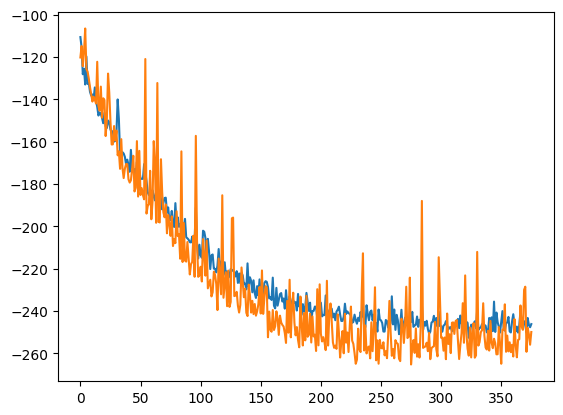

train_weighted_vae: enc
train: iter 0  trainloss -247.35695  validloss -223.35953±0.00000  bestvalidloss -223.35953  last_update 0
train: iter 1  trainloss -250.08456  validloss -260.31323±0.00000  bestvalidloss -260.31323  last_update 0
train: iter 2  trainloss -249.35896  validloss -256.44350±0.00000  bestvalidloss -260.31323  last_update 1
train: iter 3  trainloss -250.32635  validloss -257.03424±0.00000  bestvalidloss -260.31323  last_update 2
train: iter 4  trainloss -249.74536  validloss -257.15540±0.00000  bestvalidloss -260.31323  last_update 3
train: iter 5  trainloss -251.12598  validloss -249.35173±0.00000  bestvalidloss -260.31323  last_update 4
train: iter 6  trainloss -250.13484  validloss -253.43174±0.00000  bestvalidloss -260.31323  last_update 5
train: iter 7  trainloss -251.72501  validloss -252.25074±0.00000  bestvalidloss -260.31323  last_update 6
train: iter 8  trainloss -250.98236  validloss -255.72980±0.00000  bestvalidloss -260.31323  last_update 7
train: iter 9

train: iter 76  trainloss -244.94020  validloss -254.09646±0.00000  bestvalidloss -260.31323  last_update 75
train: iter 77  trainloss -250.98018  validloss -256.50813±0.00000  bestvalidloss -260.31323  last_update 76
train: iter 78  trainloss -249.66509  validloss -256.10107±0.00000  bestvalidloss -260.31323  last_update 77
train: iter 79  trainloss -250.95503  validloss -256.87969±0.00000  bestvalidloss -260.31323  last_update 78
train: iter 80  trainloss -248.74943  validloss -256.96646±0.00000  bestvalidloss -260.31323  last_update 79
train: iter 81  trainloss -241.14300  validloss -256.60669±0.00000  bestvalidloss -260.31323  last_update 80
train: iter 82  trainloss -250.82751  validloss -253.85490±0.00000  bestvalidloss -260.31323  last_update 81
train: iter 83  trainloss -248.78316  validloss -258.14784±0.00000  bestvalidloss -260.31323  last_update 82
train: iter 84  trainloss -248.92641  validloss -251.70384±0.00000  bestvalidloss -260.31323  last_update 83
train: iter 85  tra

train: iter 151  trainloss -247.64465  validloss -240.35306±0.00000  bestvalidloss -260.72457  last_update 54
train: iter 152  trainloss -248.26231  validloss -251.39257±0.00000  bestvalidloss -260.72457  last_update 55
train: iter 153  trainloss -250.62850  validloss -250.56737±0.00000  bestvalidloss -260.72457  last_update 56
train: iter 154  trainloss -247.73113  validloss -252.18763±0.00000  bestvalidloss -260.72457  last_update 57
train: iter 155  trainloss -252.04496  validloss -258.45268±0.00000  bestvalidloss -260.72457  last_update 58
train: iter 156  trainloss -251.68573  validloss -254.29301±0.00000  bestvalidloss -260.72457  last_update 59
train: iter 157  trainloss -249.93585  validloss -252.63861±0.00000  bestvalidloss -260.72457  last_update 60
train: iter 158  trainloss -246.56239  validloss -257.78820±0.00000  bestvalidloss -260.72457  last_update 61
train: iter 159  trainloss -252.38441  validloss -235.40506±0.00000  bestvalidloss -260.72457  last_update 62
train: ite

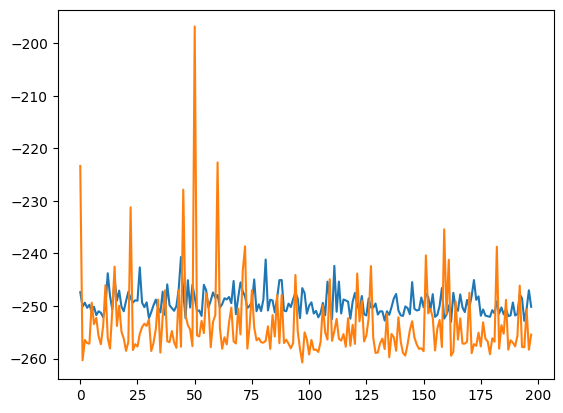

train_weighted_vae: dec
train: iter 0  trainloss -249.60173  validloss -252.77941±0.00000  bestvalidloss -252.77941  last_update 0
train: iter 1  trainloss -249.94805  validloss -260.24810±0.00000  bestvalidloss -260.24810  last_update 0
train: iter 2  trainloss -248.99021  validloss -246.96598±0.00000  bestvalidloss -260.24810  last_update 1
train: iter 3  trainloss -249.81088  validloss -255.86320±0.00000  bestvalidloss -260.24810  last_update 2
train: iter 4  trainloss -243.06818  validloss -246.13263±0.00000  bestvalidloss -260.24810  last_update 3
train: iter 5  trainloss -249.37747  validloss -261.23143±0.00000  bestvalidloss -261.23143  last_update 0
train: iter 6  trainloss -252.28297  validloss -258.72099±0.00000  bestvalidloss -261.23143  last_update 1
train: iter 7  trainloss -247.89163  validloss -250.59133±0.00000  bestvalidloss -261.23143  last_update 2
train: iter 8  trainloss -250.44555  validloss -260.02018±0.00000  bestvalidloss -261.23143  last_update 3
train: iter 9

train: iter 76  trainloss -250.09933  validloss -257.29622±0.00000  bestvalidloss -269.98728  last_update 60
train: iter 77  trainloss -251.90733  validloss -258.26852±0.00000  bestvalidloss -269.98728  last_update 61
train: iter 78  trainloss -247.32069  validloss -256.52195±0.00000  bestvalidloss -269.98728  last_update 62
train: iter 79  trainloss -251.03754  validloss -258.81725±0.00000  bestvalidloss -269.98728  last_update 63
train: iter 80  trainloss -253.11149  validloss -257.79457±0.00000  bestvalidloss -269.98728  last_update 64
train: iter 81  trainloss -251.81600  validloss -251.46635±0.00000  bestvalidloss -269.98728  last_update 65
train: iter 82  trainloss -252.71808  validloss -257.19145±0.00000  bestvalidloss -269.98728  last_update 66
train: iter 83  trainloss -253.06595  validloss -264.29621±0.00000  bestvalidloss -269.98728  last_update 67
train: iter 84  trainloss -250.00233  validloss -262.91650±0.00000  bestvalidloss -269.98728  last_update 68
train: iter 85  tra

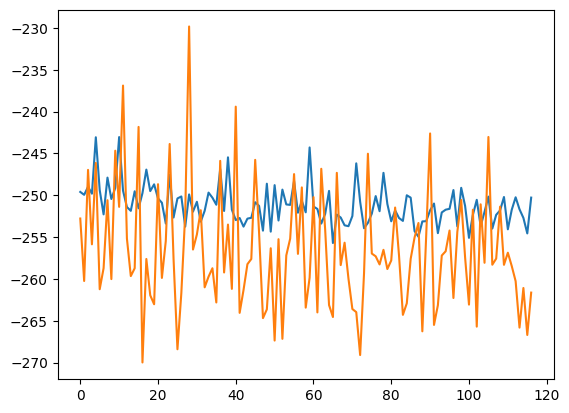

alpha 0.3 vae_lr 0.0005


In [17]:

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
print("alpha",alpha, "vae_lr", vae_lr)
# plt.ylim([-2000, 1000])


 0 9.5367431640625e-07
c = 0.24603785708608733

 1 3.9717206954956055
c = 0.16066558322216593
predict diverge [ 40.13321104 105.63588421] sim_timestep 123

 2 2.5999596118927
c = 0.27820177417669223
predict diverge [ 42.48136704 107.29300824] sim_timestep 71

 3 1.4953532218933105
c = 0.016091333487419746
predict diverge [ 30.905053   106.75944392] sim_timestep 73

 4 1.6883985996246338
c = 0.29561456043909073
predict diverge [ 80.43582082 132.59999185] sim_timestep 129

 5 2.6670937538146973
c = 0.25955872280811804
predict diverge [2005.08603415   86.32001485] sim_timestep 68

 6 1.484114646911621
c = 0.24879812903671872
predict diverge [ 59.2633309  128.18374209] sim_timestep 154

 7 3.2144200801849365
c = 0.025539426641916173
predict diverge [ 46.95894292 122.54536433] sim_timestep 70

 8 1.4027369022369385
c = 0.13887651351336147
predict diverge [-132.9182153   107.18447951] sim_timestep 95

 9 1.9502999782562256
c = 0.18599354138539106
predict diverge [ 99.81693272 115.30411087] 

predict diverge [118.80333388  92.18803634] sim_timestep 42

 79 0.8956677913665771
c = 0.08769675464416
predict diverge [248.51606859 129.8872067 ] sim_timestep 70

 80 1.5266413688659668
c = 0.1333779441471739
predict diverge [117.614894  107.0449581] sim_timestep 75

 81 1.4712419509887695
c = 0.2819948233887787
predict diverge [147.79537846 127.73503406] sim_timestep 69

 82 1.416395664215088
c = 0.29832471797738264
predict diverge [224.3022871   78.48969587] sim_timestep 91

 83 1.8290817737579346
c = 0.227922273412531

 84 4.12542462348938
c = 0.22604300565967983
predict diverge [3157.66082789  113.701975  ] sim_timestep 77

 85 1.5559954643249512
c = 0.1663552847781854

 86 4.03982949256897
c = 0.23996599549360814
predict diverge [ 47.80906716 104.43213085] sim_timestep 145

 87 2.879340887069702
c = 0.18278891593893537
predict diverge [ 63.9353284  107.97138319] sim_timestep 103

 88 2.0798544883728027
c = 0.07447330244596957
predict diverge [ 15.91237717 105.90876536] sim_time

predict diverge [ 40.05039679 116.33588266] sim_timestep 92

 57 1.8277032375335693
c = 0.01498453546736489
predict diverge [ 2.59189966e+07 -8.73772599e+02] sim_timestep 76

 58 1.5363483428955078
c = 0.21811946467193508
predict diverge [ 36.81767762 105.14281415] sim_timestep 72

 59 1.4693048000335693
c = 0.13878409680881773
predict diverge [ 52.89915646 111.97942429] sim_timestep 119

 60 2.4027154445648193
c = 0.16079149067954254
predict diverge [ 40.32666333 108.84085466] sim_timestep 70

 61 1.4411547183990479
c = 0.16441508526340307
predict diverge [ -7.85870528 129.3620737 ] sim_timestep 72

 62 1.542264461517334
c = 0.27999417181324643
predict diverge [ 41.18438309 108.25130066] sim_timestep 90

 63 1.8790457248687744
c = 0.10988592945532823
predict diverge [181.95208963 101.92787097] sim_timestep 73

 64 1.5250742435455322
c = 0.1824029558914548
predict diverge [5590.58024879  102.45728693] sim_timestep 120

 65 2.329904317855835
c = 0.2984102399791032
predict diverge [ 36.2

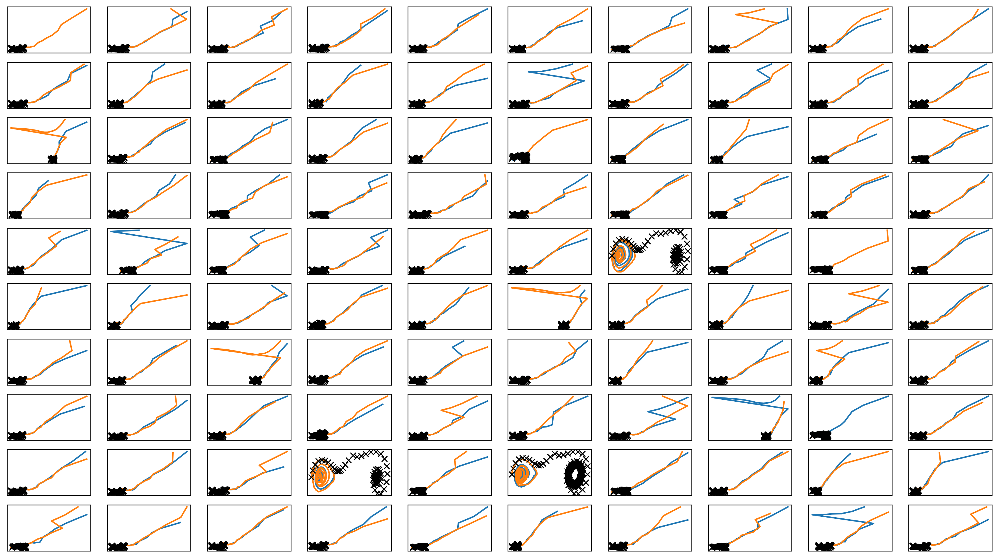

In [18]:
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
# simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0d = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0e = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
#     ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"iter1.png")
plt.savefig(figfilenamehead+"iter1.eps")
# plt.savefig(figfilenamehead+"iter1.pdf")
print("実環境方策rollout vs Sim環境方策rollout")

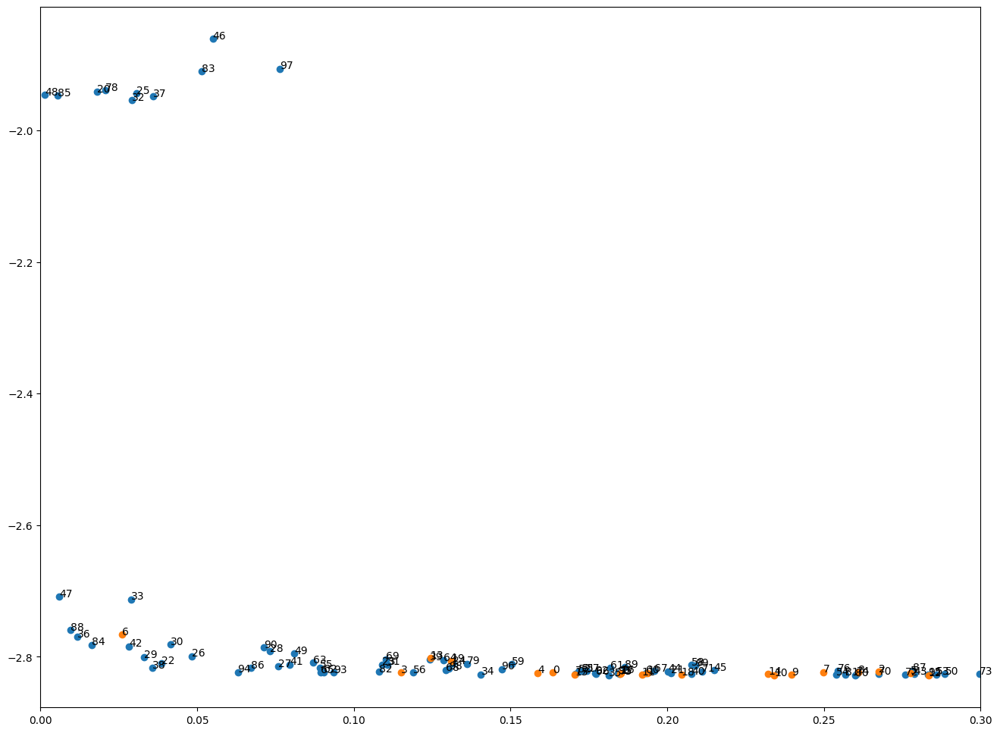

[0.16346495 0.19376823 0.2675319  0.11503246 0.15866848 0.27767899
 0.02613879 0.24978595 0.26100364 0.23974757]
[0.23415875 0.19197631 0.28340068 0.12439858 0.23227011 0.17053018
 0.18529065 0.1850802  0.20454609 0.13110959]
[0.01806764 0.20119136 0.03867789 0.10911323 0.13158045 0.03061344
 0.04839286 0.07598748 0.07332768 0.03311254]
[0.04145489 0.11061755 0.02913038 0.02882952 0.14059536 0.18145366
 0.01175634 0.03605897 0.03561832 0.1242789 ]
[0.20774164 0.07961685 0.02818215 0.27878886 0.20022311 0.21489816
 0.05495741 0.00603226 0.00140864 0.08100239]
[0.28865656 0.1728472  0.17167557 0.2858247  0.2539226  0.08923109
 0.11895172 0.17438186 0.20775948 0.15039731]
[0.19319706 0.18191796 0.09047245 0.08702328 0.12863061 0.0894847
 0.17726183 0.19596025 0.12942553 0.11026856]
[0.26757701 0.21116658 0.27584478 0.2996541  0.26043782 0.18466787
 0.25440247 0.17073022 0.0207501  0.1360628 ]
[0.2599147  0.256741   0.10799342 0.0514889  0.0163014  0.00555654
 0.06717741 0.27842439 0.00955

In [19]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter1.png")
plt.savefig(figfilenamehead+"damping_latent_iter1.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter1.pdf")
plt.show()

# plt.figure(figsize=(16,12))
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
# plt.xlim([0.06,0.14])
# plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [20]:
print(datetime.datetime.now())

2023-04-19 17:07:50.690299


# Iter2

In [21]:
iwvi.get_sim_rollout_bamdppolicy_data_randomstop()


 0
c = 0.19419571247512932
c = 0.22105653540879552
predict diverge [4939.13785424  128.06056597] sim_timestep 47
predict diverge [-2.47404509e+13  7.73425910e+07] sim_timestep 48
predict diverge [ 24.86441535 106.79425678] sim_timestep 63
predict diverge [ 34.98264255 118.76897284] sim_timestep 64
predict diverge [ 46.09523731 125.02649557] sim_timestep 65
predict diverge [169.20066187 134.37695709] sim_timestep 66
predict diverge [-1.09492694e+13  2.35185615e+07] sim_timestep 67
c = 0.25454412610605565
c = 0.10341573154169262
c = 0.042488263659300696
predict diverge [-2.66959588e+09  1.73940274e+03] sim_timestep 39
c = 0.15745049783332504
c = 0.2752120212823561
predict diverge [ 48.47175053 119.84208793] sim_timestep 41
predict diverge [725.29071291 136.60163437] sim_timestep 42
predict diverge [ 2.38116076e+13 -1.77983728e+07] sim_timestep 43
predict diverge [ 1.42704451e+20 -1.41760630e+18] sim_timestep 44
predict diverge [ 4.42230776e+19 -3.98465999e+18] sim_timestep 45
c = 0.2414

c = 0.15943187565774414
c = 0.03953333435711409
c = 0.14605597085622835
c = 0.2515922557801222
c = 0.06520321256408852
c = 0.112861312846947
c = 0.10794771998364368
c = 0.1313091412014966
predict diverge [ 31.83443337 102.46688623] sim_timestep 127
predict diverge [ 42.65984941 122.46301016] sim_timestep 128
predict diverge [ 99.38394869 131.37385382] sim_timestep 129
predict diverge [-3.24685827e+13  3.97881644e+07] sim_timestep 130
c = 0.1114667379257338
c = 0.09640134745495732
c = 0.14480561954318016
c = 0.26123591868768
c = 0.15533341445432589
predict diverge [5361.59934925  122.32578975] sim_timestep 69
predict diverge [1.51268584e+13 5.13286604e+07] sim_timestep 70
predict diverge [-4.02916524e+13 -8.79892298e+05] sim_timestep 71
predict diverge [-1715.17571048   -94.00265017] sim_timestep 72
predict diverge [121.76086034 -87.82218308] sim_timestep 73
predict diverge [3.87134834e+19 7.67250892e+15] sim_timestep 74
c = 0.27653649536027003
c = 0.10367197224940466
predict diverge [ 

c = 0.04876033439827469
c = 0.09837296523415263
c = 0.25567454863774824
c = 0.10158542384105779
c = 0.15221659941522375
c = 0.031879658691726674
c = 0.21343794238216393
predict diverge [-7092.46548865   102.38069294] sim_timestep 77
predict diverge [ 23.84472592 103.10546152] sim_timestep 92
predict diverge [ 33.72037303 116.10106048] sim_timestep 93
predict diverge [ 44.31501378 123.97839112] sim_timestep 94
predict diverge [162.16190327 132.78785038] sim_timestep 95
predict diverge [ 2.62171445e+13 -4.91883096e+06] sim_timestep 96
predict diverge [-6.26433635e+19  2.19861705e+19] sim_timestep 97

 9
c = 0.17087942415319332
c = 0.29534693659344124
c = 0.03022981874548597
c = 0.19061724093382426
c = 0.16402574110895113
c = 0.19184372903863403
predict diverge [ 30.1946766  109.34716891] sim_timestep 109
predict diverge [ 40.86827801 123.17407682] sim_timestep 110
predict diverge [ 61.60937289 129.85864328] sim_timestep 111
predict diverge [2.30935180e+05 1.47352593e+02] sim_timestep 112

c = 0.056888679842649725
c = 0.2376014875563042
c = 0.29957312614151804
c = 0.11370630084314513
c = 0.2693163313695598
c = 0.18578285384645046
c = 0.007596458050063681
c = 0.03214558417062593

 14
c = 0.004203169221377934
c = 0.16598191418276328
c = 0.07082136447170069
c = 0.05921924365782248
c = 0.24485817403427154
c = 0.25996612069401664
c = 0.14864330455966526
c = 0.29044562011725517
c = 0.13256476300868833
c = 0.16973680349742035
c = 0.01750523324342035
c = 0.00042329539930675565
predict diverge [ 41.89321858 106.29558088] sim_timestep 82
predict diverge [ 51.25656942 130.74255288] sim_timestep 83
predict diverge [5088.25540394  139.24037847] sim_timestep 84
predict diverge [ 1.68144096e+12 -1.55747112e+07] sim_timestep 85
predict diverge [ 6.37502598e+19 -1.56025849e+19] sim_timestep 86
c = 0.2562153105589263
c = 0.19706564026974835
predict diverge [ 41.04482929 116.3403996 ] sim_timestep 77
predict diverge [ 77.39490338 130.04984477] sim_timestep 78
predict diverge [-7.80729314e+

c = 0.154678603644002
c = 0.009167638955405987
c = 0.062388016507216135
c = 0.10911517401062944
c = 0.060051749598506954
c = 0.1871824659462979
predict diverge [3366.49570306   87.42531629] sim_timestep 68
predict diverge [-1.20477473e+13  1.28107107e+08] sim_timestep 69
predict diverge [ 25.26440369 107.52267321] sim_timestep 84
predict diverge [ 35.44916677 119.12702582] sim_timestep 85
predict diverge [ 47.15826739 125.39362122] sim_timestep 86
predict diverge [-686.2161425   135.41087742] sim_timestep 87
predict diverge [ 22.6897756  100.16769077] sim_timestep 102
predict diverge [ 32.42296778 115.19526138] sim_timestep 103
predict diverge [ 43.63811794 122.94002882] sim_timestep 104
predict diverge [-38.72832166 132.17451044] sim_timestep 105
predict diverge [ 26.68783646 110.55051265] sim_timestep 113
predict diverge [ 36.85253723 118.33022707] sim_timestep 114
predict diverge [ 47.83304432 126.55840836] sim_timestep 115
predict diverge [ 24.64845745 136.01912447] sim_timestep 11

predict diverge [ 23.41126316 101.48839033] sim_timestep 109
predict diverge [ 33.29608251 115.98548066] sim_timestep 110
predict diverge [ 43.7762566  123.63920613] sim_timestep 111
predict diverge [ -2.71116967 132.27266739] sim_timestep 112
predict diverge [  5.9715338  102.02629971] sim_timestep 113
predict diverge [ 14.28458041 102.13515943] sim_timestep 114
predict diverge [ 23.26772244 109.3363346 ] sim_timestep 115
predict diverge [ 33.09065099 115.65235176] sim_timestep 116
predict diverge [ 43.74508348 123.52603207] sim_timestep 117
predict diverge [  7.60953456 132.28096203] sim_timestep 118
predict diverge [ 15.97820979 103.26532804] sim_timestep 119
predict diverge [ 25.0969417  110.10173323] sim_timestep 120
predict diverge [ 35.2381483  118.93291851] sim_timestep 121
predict diverge [ 46.30332239 125.25183669] sim_timestep 122
predict diverge [-403.24693954  134.59638725] sim_timestep 123
predict diverge [ 23.68055779 102.5762705 ] sim_timestep 138
predict diverge [ 33.7

predict diverge [ 26.70102142 106.21921924] sim_timestep 256
predict diverge [ 36.86259226 118.37109291] sim_timestep 257
predict diverge [ 46.88301868 126.62138395] sim_timestep 258
predict diverge [-166.63634546  135.18507162] sim_timestep 259
predict diverge [ 22.86541939 100.05639523] sim_timestep 274
predict diverge [ 32.68251031 115.33549647] sim_timestep 275
c = 0.12901525103429562
c = 0.08005865449997542
c = 0.15105721863790111
c = 0.25601193440129755
c = 0.16781061180229098
c = 0.07037592429589982
c = 0.04963464561359517
c = 0.2637942570414637
c = 0.11297325789104748
c = 0.07668151243684741

 29
c = 0.1166177280934772
c = 0.1958994635806282
c = 0.24074229887312118
c = 0.08433271179047154
c = 0.1150818478226997
c = 0.15500359708300687
c = 0.2250086626251088
c = 0.10824089883737953
c = 0.1326842196243943
predict diverge [ 64.66516562 101.46778413] sim_timestep 39
predict diverge [-1.88931956e+06  1.39035962e+02] sim_timestep 40
c = 0.10932831128284111
c = 0.03818417142450907

 3

c = 0.28502115298666514
c = 0.22369386717661943
predict diverge [-3022.21433796    97.04171561] sim_timestep 32
predict diverge [ 24.63122612 109.8609779 ] sim_timestep 47
predict diverge [ 34.66080723 117.94033099] sim_timestep 48
predict diverge [ 46.16820587 125.62004146] sim_timestep 49
predict diverge [213.67516896 135.36723747] sim_timestep 50
predict diverge [-1.86582245e+14 -1.49118939e+07] sim_timestep 51
predict diverge [-5628.48492661   -93.54921873] sim_timestep 52
predict diverge [-503.33716918  -86.9207552 ] sim_timestep 53
predict diverge [-1142.138745     -80.02947305] sim_timestep 54
predict diverge [-251.83552816  -72.97780696] sim_timestep 55
predict diverge [-132.62543239  -65.70477168] sim_timestep 56
predict diverge [-103.44745693  -58.23063856] sim_timestep 57
predict diverge [-104.81125523  -50.30049461] sim_timestep 58
predict diverge [-120.47130158  -42.8851865 ] sim_timestep 59
c = 0.2767931737848161
c = 0.0053330534649381756
c = 0.002669194944685027
c = 0.13

predict diverge [ 23.69783571 103.66279135] sim_timestep 90
predict diverge [ 33.57724663 115.94768103] sim_timestep 91
predict diverge [ 44.36099549 123.89870946] sim_timestep 92
predict diverge [ 42.84493905 132.80679117] sim_timestep 93
predict diverge [ 23.79946467 131.48121248] sim_timestep 94
predict diverge [ 33.82677891 117.92309482] sim_timestep 95
predict diverge [ 45.05796281 124.09275527] sim_timestep 96
predict diverge [ 36.48656855 133.41691074] sim_timestep 97
predict diverge [ 48.5377371  126.28067262] sim_timestep 98
predict diverge [583.02312046 136.71265821] sim_timestep 99
predict diverge [-7.18587862e+12 -7.17783666e+06] sim_timestep 100
predict diverge [-255.21932245  -94.01075467] sim_timestep 101
predict diverge [-696.99849793  -87.86421537] sim_timestep 102
predict diverge [332.96956622 -81.49561946] sim_timestep 103
predict diverge [1.02052283e+20 6.78012377e+17] sim_timestep 104
c = 0.019679989380769435
predict diverge [474.28985757 120.86706766] sim_timestep

c = 0.14509618567859825
c = 0.12094000989994393
c = 0.04934724630821883
c = 0.18969785284279395
c = 0.2983350591052395

 41
c = 0.011091157086341319
c = 0.19938880920477908
c = 0.12486283878431309
c = 0.07247669365379665
c = 0.26479259640336084
c = 0.06756340205177121
c = 0.05388292432606606
c = 0.06908598045460082
c = 0.21725076196523854
c = 0.20627226851137936
predict diverge [ 44.77056786 123.52937326] sim_timestep 42
predict diverge [-44.74430608 133.1791165 ] sim_timestep 43
predict diverge [ 21.74492796 106.53912285] sim_timestep 51
predict diverge [ 31.4502255  114.47824942] sim_timestep 52
predict diverge [ 42.04077585 122.14536154] sim_timestep 53
predict diverge [ 35.40507125 130.87660848] sim_timestep 54
predict diverge [ 46.13014393 125.39279888] sim_timestep 55
predict diverge [ 99.16756434 134.45359698] sim_timestep 56
predict diverge [ 1.52257057e+13 -1.66309599e+06] sim_timestep 57
predict diverge [-4.00986318e+18  1.92678425e+18] sim_timestep 58
predict diverge [ 32.46

predict diverge [ 23.3307     102.74215225] sim_timestep 94
predict diverge [ 33.12489451 115.81155271] sim_timestep 95
predict diverge [ 43.98514666 123.62387454] sim_timestep 96
predict diverge [ 71.64908295 132.58103711] sim_timestep 97
predict diverge [-1.04870181e+08  1.87141402e+02] sim_timestep 98
predict diverge [ 23.29025406 101.56030538] sim_timestep 113
predict diverge [ 33.27547655 117.62077172] sim_timestep 114
predict diverge [ 44.08508979 123.73278816] sim_timestep 115
predict diverge [-87.84063053 132.61802015] sim_timestep 116
c = 0.18120559733352412
predict diverge [379.67749907  86.89549718] sim_timestep 35
predict diverge [-3.58373790e+13  6.80258086e+06] sim_timestep 36
predict diverge [ 23.71204494 102.52482776] sim_timestep 51
predict diverge [ 33.59349674 116.09236736] sim_timestep 52
predict diverge [ 44.27572067 123.98551094] sim_timestep 53
predict diverge [238.69612947 132.80987531] sim_timestep 54
predict diverge [1.21793436e+12 2.00899388e+07] sim_timestep

c = 0.1654853668153556
c = 0.1749295948933585
c = 0.039632871929978726

 53
c = 0.10862476812704878
c = 0.24142110733925248
c = 0.22997468680945404
c = 0.24455989064290126
c = 0.02922850494965885
c = 0.15195250228907303
c = 0.05804216837801844
c = 0.030062354978027103
c = 0.13084197055505037
c = 0.040366907811307216
c = 0.19567590956710848
c = 0.2650233521297091
c = 0.13605544396989921
c = 0.03804072794605877
c = 0.09561002930295212
c = 0.07237525069951004

 54
c = 0.1582820720009758
c = 0.2219481452932272
c = 0.13784909365430922
c = 0.07259373147738878
predict diverge [-1676.50539165    54.10866467] sim_timestep 87
c = 0.18968652048543164
c = 0.05139961362032897
c = 0.07649218269651963
c = 0.20515482156719847
c = 0.27151568755118366
c = 0.10727641358111384
c = 0.056436398505734196
c = 0.1270199003852139

 55
c = 0.10645967855776636
c = 0.05590837238034315
predict diverge [ 18.70363091 120.60970779] sim_timestep 108
predict diverge [ 28.16805656 113.55938514] sim_timestep 109
predict d

c = 0.0453791327274772
c = 0.15722053274734088

 60
c = 0.17187068188178578
c = 0.10270322190382332
predict diverge [ 40.26307725 100.19744496] sim_timestep 69
predict diverge [ 46.85686197 129.4082988 ] sim_timestep 70
predict diverge [-368.66221899  135.11351054] sim_timestep 71
predict diverge [ 31.80210344 112.59210627] sim_timestep 87
predict diverge [ 42.29169018 122.42526527] sim_timestep 88
predict diverge [ 62.39920369 131.0523469 ] sim_timestep 89
predict diverge [8.45317773e+05 1.50739728e+02] sim_timestep 90
predict diverge [-1.10612439e+13  9.69752730e+06] sim_timestep 91
predict diverge [ 24.94936785 105.76107311] sim_timestep 106
predict diverge [ 34.95483287 117.05697153] sim_timestep 107
predict diverge [ 46.35040628 127.09008279] sim_timestep 108
predict diverge [-193.27089095  134.65745372] sim_timestep 109
predict diverge [ 25.29779432 106.89008534] sim_timestep 124
predict diverge [ 35.43212853 118.98099925] sim_timestep 125
predict diverge [ 46.49511096 125.384231

c = 0.24954852387393914
c = 0.10303686124958807
predict diverge [ 24.2112386  104.73797506] sim_timestep 69
predict diverge [ 34.10778586 116.35669854] sim_timestep 70
predict diverge [ 44.76555483 124.30294282] sim_timestep 71
predict diverge [ 33.8749045  133.19933225] sim_timestep 72
predict diverge [ 44.5709275  124.11673684] sim_timestep 73
predict diverge [ -7.59651195 132.98553127] sim_timestep 74
predict diverge [  1.02845694 100.0442302 ] sim_timestep 75
predict diverge [  9.61123116 102.94856553] sim_timestep 76
predict diverge [ 18.04419331 103.85402504] sim_timestep 77
predict diverge [ 27.3906413  111.46662818] sim_timestep 78
predict diverge [ 37.60896642 118.90006564] sim_timestep 79
c = 0.06601628867110068
predict diverge [ 42.64512932 100.42336713] sim_timestep 110
predict diverge [ 37.46038065 131.34731028] sim_timestep 111
predict diverge [ 45.17168132 127.09393714] sim_timestep 112
predict diverge [353.93071257 133.5501251 ] sim_timestep 113
predict diverge [ 3.1829

predict diverge [ 5.97438330e+19 -2.31982464e+18] sim_timestep 54
c = 0.05073308400351277
c = 0.24199396226343187
c = 0.2669399212300717

 70
c = 0.13711285823290434
c = 0.04251541934865818
c = 0.08348398971993196
predict diverge [ 43.46817084 104.15934929] sim_timestep 50
predict diverge [ 89.48087538 132.01922122] sim_timestep 51
predict diverge [2.56146540e+11 2.83921607e+05] sim_timestep 52
predict diverge [ 1.43573663e+13 -1.49190954e+07] sim_timestep 53
predict diverge [-5.12303966e+19 -1.79126976e+19] sim_timestep 54
c = 0.06272744083358686
c = 0.10446599223111429
predict diverge [ 29.61225495 107.68790073] sim_timestep 104
predict diverge [ 40.06834982 120.64257845] sim_timestep 105
predict diverge [ 61.56583505 129.22720989] sim_timestep 106
predict diverge [9.84761720e+05 1.49844429e+02] sim_timestep 107
predict diverge [-2.19914031e+13  7.36719192e+06] sim_timestep 108
predict diverge [ 31.77856153 114.98436318] sim_timestep 124
predict diverge [ 42.5503999  122.40658294] si

c = 0.13858781603523546
c = 0.2371778870061576
predict diverge [ 47.08966306 111.38521186] sim_timestep 47
predict diverge [-221.92183121  135.32267548] sim_timestep 48
c = 0.29767025614372933
c = 0.21517189885769886
c = 0.22238363045390636
predict diverge [ 36.26430969 114.47317003] sim_timestep 96
predict diverge [ 47.14758458 126.04464957] sim_timestep 97
predict diverge [-555.36982846  135.36445931] sim_timestep 98
predict diverge [ 32.04738603 115.76257966] sim_timestep 114
predict diverge [ 42.87860335 122.66142285] sim_timestep 115
predict diverge [  7.07812428 131.51624622] sim_timestep 116
predict diverge [ 15.39203864 102.85807463] sim_timestep 117
predict diverge [ 24.47373851 110.40904229] sim_timestep 118
predict diverge [ 34.55277627 118.44253129] sim_timestep 119
predict diverge [ 45.1377801  124.66566788] sim_timestep 120
predict diverge [154.72531676 133.51543073] sim_timestep 121
predict diverge [-1.67125452e+13  1.05696815e+07] sim_timestep 122
c = 0.1246596219777711

c = 0.22002470741920965
c = 0.2628452439876212
c = 0.22997577584527604
c = 0.020140619876378472
c = 0.13976371075018665
c = 0.03306781570431563
c = 0.27880468008693043
c = 0.27185350513254725
c = 0.03647444065597048
predict diverge [ 42.26700309 108.24080305] sim_timestep 112
predict diverge [104.07296448 131.03677054] sim_timestep 113
predict diverge [-2.56901274e+13 -1.21892345e+06] sim_timestep 114
predict diverge [2401.29336019  -93.99351797] sim_timestep 115
predict diverge [ 3.79532053e+19 -6.90026103e+18] sim_timestep 116

 81
c = 0.16927401988013097
c = 0.28081607384773716
c = 0.0411067151858241
c = 0.014100014897187263
predict diverge [143.44226416 111.19488464] sim_timestep 132
predict diverge [ 9.11825250e+12 -6.90392387e+06] sim_timestep 133
predict diverge [5.96634025e+18 1.17233754e+19] sim_timestep 134
predict diverge [1.32450370e+13 2.04156717e+07] sim_timestep 135
predict diverge [4.14767451e+13 1.58904479e+07] sim_timestep 136
predict diverge [-1.68185304e+13 -1.66643

predict diverge [ 32.41512559 114.82156662] sim_timestep 182
predict diverge [ 43.3637708 122.9096741] sim_timestep 183
predict diverge [ 83.7843751  131.92358316] sim_timestep 184
predict diverge [1.90277235e+10 2.12662552e+04] sim_timestep 185
predict diverge [-4.89678503e+13 -2.07241669e+07] sim_timestep 186
predict diverge [1435.99017416  -94.04348445] sim_timestep 187
predict diverge [-8.70228775e+19  4.78894156e+17] sim_timestep 188
c = 0.028379221104861983
c = 0.05008413167020278
predict diverge [ 44.94814635 117.80696388] sim_timestep 51
predict diverge [ 45.34800912 133.33777755] sim_timestep 52
predict diverge [-232.81081153  133.70757734] sim_timestep 53
predict diverge [ 24.11327568 103.75205212] sim_timestep 68
predict diverge [ 34.19957562 118.17086859] sim_timestep 69
predict diverge [ 44.88936689 124.40364793] sim_timestep 70
predict diverge [-58.87099558 133.2913098 ] sim_timestep 71
predict diverge [ 29.88066483 111.31842842] sim_timestep 82
predict diverge [ 40.50327

predict diverge [ 3.14431225e+07 -2.79377975e+02] sim_timestep 90
predict diverge [ 1.35914644e+20 -4.30269078e+19] sim_timestep 91
c = 0.10554120438698235
predict diverge [-19881.99060592    137.52035097] sim_timestep 48
predict diverge [ 24.62702128 105.28073886] sim_timestep 63
predict diverge [ 34.59380759 116.70350354] sim_timestep 64
predict diverge [ 45.41985687 124.68964048] sim_timestep 65
predict diverge [-225.72076038  133.79833056] sim_timestep 66
predict diverge [ 23.51512756 103.20599481] sim_timestep 81
predict diverge [ 33.47592044 117.53822669] sim_timestep 82
predict diverge [ 44.38319473 123.76912401] sim_timestep 83
predict diverge [ 51.22627024 132.799927  ] sim_timestep 84
predict diverge [-2057.98297062   139.10867952] sim_timestep 85
predict diverge [ 32.6039746  114.16886642] sim_timestep 101
predict diverge [ 43.26267616 123.18834419] sim_timestep 102
predict diverge [-24.15043499 131.85641623] sim_timestep 103
predict diverge [ 17.51394077 103.88338502] sim_t

predict diverge [ 24.99150941 107.21290132] sim_timestep 176
predict diverge [ 35.00051535 117.01757879] sim_timestep 177
predict diverge [ 45.67464459 125.03091794] sim_timestep 178
predict diverge [-218.47694348  134.02009895] sim_timestep 179
predict diverge [ 31.99207535 114.15777326] sim_timestep 195
predict diverge [ 42.65954861 122.57628397] sim_timestep 196
predict diverge [ 10.08876629 131.36977753] sim_timestep 197
predict diverge [ 18.64298725 105.46152407] sim_timestep 198
predict diverge [ 28.0986254  113.49605974] sim_timestep 199
predict diverge [ 38.41074973 119.39430397] sim_timestep 200
predict diverge [ 45.47895038 127.85285132] sim_timestep 201
predict diverge [ 22.66714376 133.8049426 ] sim_timestep 202
predict diverge [ 32.44759746 115.15317234] sim_timestep 203
predict diverge [ 43.29876024 125.03753352] sim_timestep 204
predict diverge [ 31.45426255 131.84880013] sim_timestep 205
predict diverge [ 42.02621218 122.12531757] sim_timestep 206
predict diverge [ 46.4

c = 0.27031123117640066
c = 0.1816708302279217
c = 0.12801026260767112
c = 0.04965877526234723
c = 0.18252278730397745
c = 0.09821097897595348
predict diverge [ 49.81662167 100.89308804] sim_timestep 64
predict diverge [-1498.9557817    137.85501134] sim_timestep 65
predict diverge [ 31.98438342 114.27594591] sim_timestep 81
predict diverge [ 42.70556134 122.56775913] sim_timestep 82
predict diverge [ 63.11386252 131.40033016] sim_timestep 83
predict diverge [-4.26142747e+05  1.48402836e+02] sim_timestep 84
predict diverge [ 23.43871141 101.93592968] sim_timestep 99
predict diverge [ 33.30464906 115.78401508] sim_timestep 100
predict diverge [ 43.84714248 123.7136398 ] sim_timestep 101
predict diverge [ 19.93309465 132.30006039] sim_timestep 102
predict diverge [ 29.49792329 114.34357549] sim_timestep 103
predict diverge [ 40.12758722 122.60888632] sim_timestep 104
predict diverge [ 56.1048498  129.25994567] sim_timestep 105
predict diverge [-76529.32328701    143.62773799] sim_timeste

In [22]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
# iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)


train: iter 0  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 0
train: iter 1  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 1
train: iter 2  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 2
train: iter 3  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 3
train: iter 4  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 4
train: iter 5  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 5
train: iter 6  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 6
train: iter 7  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 7
train: iter 8  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 8
train: iter 9  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 9
train: iter 10  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 10
train: iter 11  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 11
train: iter 

train: iter 98  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 98
train: iter 99  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 99
train: iter 100  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 100
train: fin


([nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan],
 [nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan

In [23]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


train_loss:  nan
valid_loss:  nan
train_loss:  nan
valid_loss:  nan


1e-08 1000.0


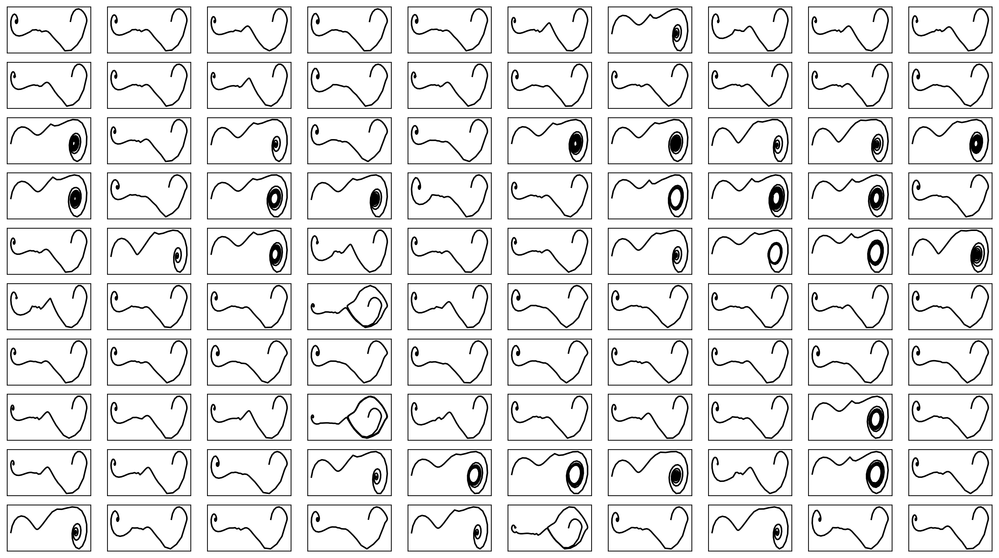

In [24]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter2.png")

In [25]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
# #     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [26]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
# #     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


train_weighted_vae: enc_dec
train: iter 0  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 0
train: iter 1  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 1
train: iter 2  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 2
train: iter 3  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 3
train: iter 4  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 4
train: iter 5  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 5
train: iter 6  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 6
train: iter 7  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 7
train: iter 8  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 8
train: iter 9  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 9
train: iter 10  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 10
train: iter 11  trainloss nan  validloss nan±nan  bestvalidloss inf 

train: iter 98  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 98
train: iter 99  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 99
train: iter 100  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 100
train: fin


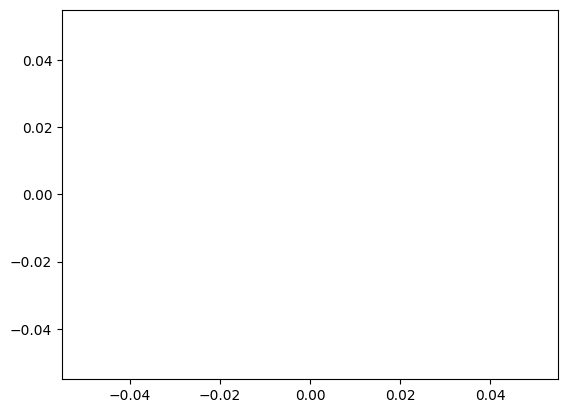

train_weighted_vae: enc
train: iter 0  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 0
train: iter 1  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 1
train: iter 2  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 2
train: iter 3  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 3
train: iter 4  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 4
train: iter 5  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 5
train: iter 6  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 6
train: iter 7  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 7
train: iter 8  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 8
train: iter 9  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 9
train: iter 10  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 10
train: iter 11  trainloss nan  validloss nan±nan  bestvalidloss inf  las

train: iter 98  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 98
train: iter 99  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 99
train: iter 100  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 100
train: fin


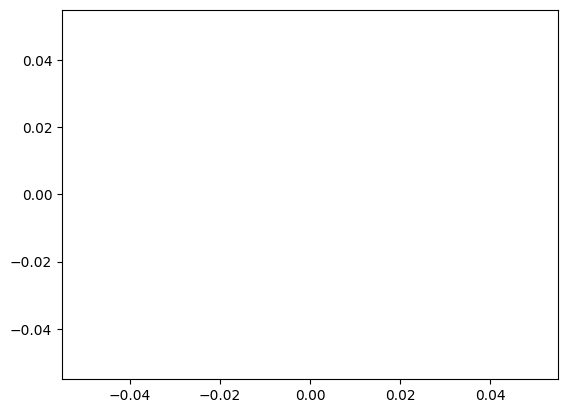

train_weighted_vae: dec
train: iter 0  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 0
train: iter 1  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 1
train: iter 2  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 2
train: iter 3  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 3
train: iter 4  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 4
train: iter 5  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 5
train: iter 6  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 6
train: iter 7  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 7
train: iter 8  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 8
train: iter 9  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 9
train: iter 10  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 10
train: iter 11  trainloss nan  validloss nan±nan  bestvalidloss inf  las

train: iter 98  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 98
train: iter 99  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 99
train: iter 100  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 100
train: fin


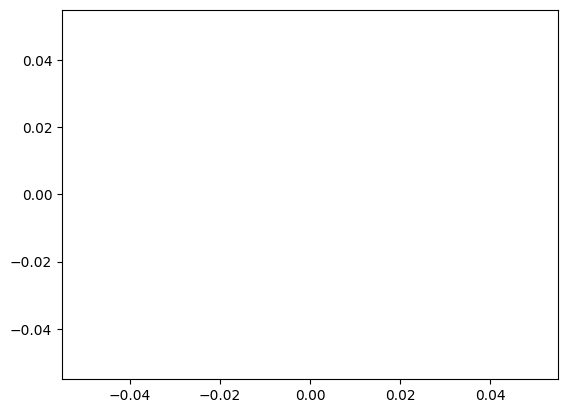

alpha 0.3 vae_lr 0.0005


In [27]:

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()


print("alpha",alpha, "vae_lr", vae_lr)
# plt.ylim([-2000, 1000])


 0 1.1920928955078125e-06
c = 0.06762995892788627

 1 6.403625726699829
c = 0.010278746635202318

 2 4.654154300689697
c = 0.254215176364625

 3 3.1551828384399414
c = 0.11898356773202066

 4 3.009295701980591
c = 0.27621006198976555

 5 3.0416347980499268
c = 0.2924126506539777

 6 3.0419678688049316
c = 0.09216518876443629

 7 3.04621958732605
c = 0.01547581338883931

 8 3.0167288780212402
c = 0.2724797600714315

 9 3.0240001678466797
c = 0.11625330404705693

 10 3.029357671737671
c = 0.02463181241873571

 11 3.0316336154937744
c = 0.21968056525516552

 12 3.0086019039154053
c = 0.2998797950056212

 13 3.005592107772827
c = 0.08459167680079728

 14 3.1288533210754395
c = 0.16074353251670212

 15 3.0285048484802246
c = 0.18869672249512084

 16 3.001218795776367
c = 0.06599518484899376

 17 5.123748064041138
c = 0.12232667660915489

 18 6.298406362533569
c = 0.28389678475491914

 19 6.2779388427734375
c = 0.23631664701500105

 20 6.329348087310791
c = 0.22302535577196583

 21 6.295289


 75 6.2901129722595215
c = 0.23885479653308017

 76 6.286993741989136
c = 0.22043881138658597

 77 6.28771448135376
c = 0.09960040775935537

 78 6.31558632850647
c = 0.2862156107181741

 79 6.288886070251465
c = 0.17429591933779048

 80 6.288122653961182
c = 0.07980550750002714

 81 6.282444953918457
c = 0.1370378843637388

 82 6.2896668910980225
c = 0.20392918354612874

 83 6.285218954086304
c = 0.032353935469957115

 84 6.28961181640625
c = 0.2500689128137631

 85 6.2861692905426025
c = 0.10979180891230161

 86 6.380830764770508
c = 0.2323099577608428

 87 6.305028915405273
c = 0.26074180566218846

 88 6.2869203090667725
c = 0.21511241261863892

 89 6.285082817077637
c = 0.21352393921182938

 90 6.288482189178467
c = 0.2820371135370327

 91 6.301533222198486
c = 0.10057750353032839

 92 6.29144549369812
c = 0.16763557935839693

 93 6.292280912399292
c = 0.0798138543542055

 94 6.284170389175415
c = 0.16157074562530785

 95 6.288640260696411
c = 0.2151592868128429

 96 6.285634994506

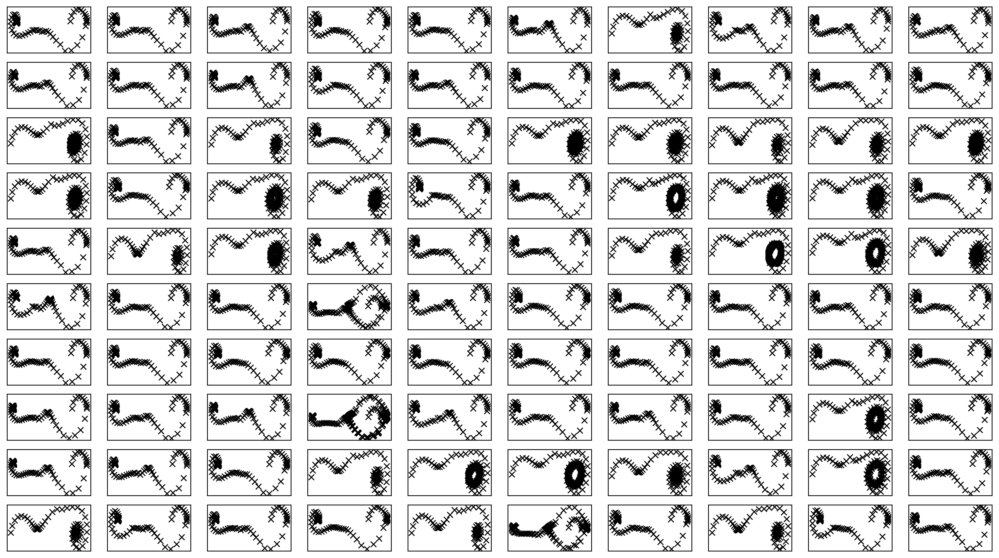

In [28]:
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
# simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
#     ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter2.png")
plt.savefig(figfilenamehead+"joint_iter2.eps")
# plt.savefig(figfilenamehead+"joint_iter2.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

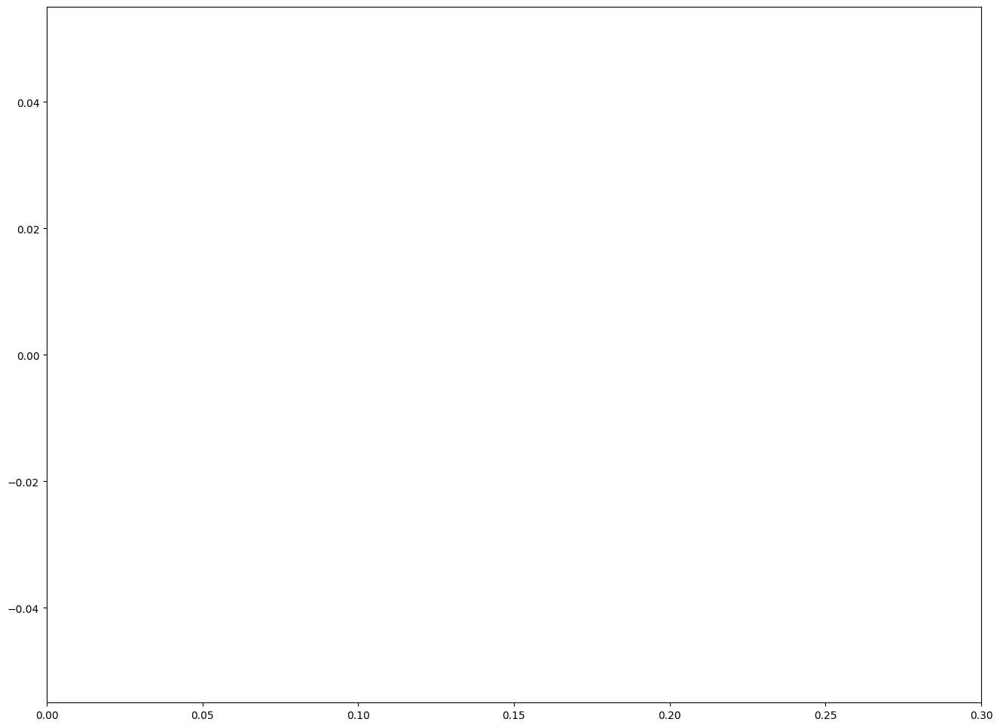

[0.16346495 0.19376823 0.2675319  0.11503246 0.15866848 0.27767899
 0.02613879 0.24978595 0.26100364 0.23974757]
[0.23415875 0.19197631 0.28340068 0.12439858 0.23227011 0.17053018
 0.18529065 0.1850802  0.20454609 0.13110959]
[0.01806764 0.20119136 0.03867789 0.10911323 0.13158045 0.03061344
 0.04839286 0.07598748 0.07332768 0.03311254]
[0.04145489 0.11061755 0.02913038 0.02882952 0.14059536 0.18145366
 0.01175634 0.03605897 0.03561832 0.1242789 ]
[0.20774164 0.07961685 0.02818215 0.27878886 0.20022311 0.21489816
 0.05495741 0.00603226 0.00140864 0.08100239]
[0.28865656 0.1728472  0.17167557 0.2858247  0.2539226  0.08923109
 0.11895172 0.17438186 0.20775948 0.15039731]
[0.19319706 0.18191796 0.09047245 0.08702328 0.12863061 0.0894847
 0.17726183 0.19596025 0.12942553 0.11026856]
[0.26757701 0.21116658 0.27584478 0.2996541  0.26043782 0.18466787
 0.25440247 0.17073022 0.0207501  0.1360628 ]
[0.2599147  0.256741   0.10799342 0.0514889  0.0163014  0.00555654
 0.06717741 0.27842439 0.00955

In [29]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter2.png")
plt.savefig(figfilenamehead+"damping_latent_iter2.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter2.pdf")
plt.show()

# plt.figure(figsize=(16,12))
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
# plt.xlim([0.06,0.14])
# plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [30]:
print(datetime.datetime.now())

2023-04-19 17:52:30.168508


# Iter 3

In [31]:
iwvi.get_sim_rollout_bamdppolicy_data_randomstop()


 0
c = 0.17947987133541277
c = 0.05971772668195194
c = 0.027311076044100577
c = 0.07358713084521273
c = 0.015750599757159468
c = 0.22885390064396655
c = 0.14806658499214023
c = 0.18749887476204166
c = 0.17059492406995422
c = 0.018560394931288058
c = 0.12374152407000233
c = 0.2936739715675561
c = 0.06683846715687287

 1
c = 0.007852829255600801
c = 0.18710804136575387
c = 0.28935273555100405
c = 0.2574672955946296
c = 0.005014261355181837
c = 0.010377486336708342
c = 0.08033816684370901
c = 0.05289860927528681
c = 0.1851152983375943
c = 0.19811931308424274
c = 0.23559135775682083
c = 0.17138307353449977
c = 0.12760995568196065
c = 0.09684176847692832
c = 0.17094368650217742

 2
c = 0.11274285309798909
c = 0.2936631539939623
c = 0.08570829939061048
c = 0.045565001342560536
c = 0.17868160771840255
c = 0.2852793301348039
c = 0.2527327826859005
c = 0.13083032150102206
c = 0.1404731159499141
c = 0.12116493267426182
c = 0.070258162699006
c = 0.14251976368172156
c = 0.003508787601365293
c = 0

c = 0.1954177462086461
c = 0.2252538932205219
c = 0.10030018720957645
c = 0.08661582633508051
c = 0.23315455167712645
c = 0.20452627298127501
c = 0.23497545925477123
c = 0.05514454444104233

 27
c = 0.08993612902974009
c = 0.21749155969557601
c = 0.10062862848214699
c = 0.027475395314346396
c = 0.02947828024652479
c = 0.20820086281007943
c = 0.05372000869238602
c = 0.20162456895014313
c = 0.21940495435170995
c = 0.2883711292545898
c = 0.1420234658410347

 28
c = 0.03356913570449407
c = 0.10283217539010275
c = 0.05123433186480941
c = 0.15549114288274063
c = 0.1935773743859334
c = 0.14149162331218926
c = 0.2891085809257248
c = 0.25981704875326017
c = 0.1496074136543351
c = 0.2843749504583838
c = 0.24792660946256798
c = 0.017840580375931614
c = 0.20970777971454502

 29
c = 0.2539020534604273
c = 0.2625984496205757
c = 0.06344761137791378
c = 0.13682600616984789
c = 0.0692712461085099
c = 0.07683806611041216
c = 0.052760874895701006
c = 0.08475897929526369
c = 0.14366640122519328
c = 0.125


 53
c = 0.24174566859794785
c = 0.24380308273136653
c = 0.13500092718934906
c = 0.14009954936212762
c = 0.2401307560957633
c = 0.28459499144905515
c = 0.2991083783211802
c = 0.16136012493602914
c = 0.29969667072338085
c = 0.08216994726272073
c = 0.19196490950412498
c = 0.11273917687385199
c = 0.01126725129895112
c = 0.05116328736463007

 54
c = 0.15794952954519884
c = 0.1594529645288462
c = 0.23097550191646202
c = 0.019282957658040188
c = 0.16744348981624435
c = 0.020571120257396113
c = 0.24120389034940548
c = 0.02517854343910506
c = 0.12202745696025966
c = 0.23425132535734666
c = 0.037908905223850285
c = 0.14942111904559718
c = 0.2065285029659944
c = 0.1125914769827012
c = 0.10673564338308744
c = 0.1542236773763941
c = 0.11785617246056207
c = 0.22729655850179428

 55
c = 0.19862555398045084
c = 0.016015281747631626
c = 0.04063268642822136
c = 0.24707078008595457
c = 0.2706807702468012
c = 0.06832489534357597
c = 0.15870440031393623
c = 0.048563514941818715
c = 0.2848301676666314
c = 

c = 0.2603673567941985
c = 0.07010608868724076
c = 0.054309390677421084
c = 0.08160185778694641
c = 0.16995419464992031
c = 0.02067470081854088
c = 0.10142672233277175
c = 0.13045093472251387
c = 0.09864994732983949

 79
c = 0.16610192145072025
c = 0.006431285005933651
c = 0.2346626348994897
c = 0.2619221587142409
c = 0.23011541612092906
c = 0.08815090708533242
c = 0.24226845061145583
c = 0.1791609431682142
c = 0.028587046873418676

 80
c = 0.09270530318511666
c = 0.15782097659730776
c = 0.20046339011043787
c = 0.11796201598631645
c = 0.07100038640814368
c = 0.022105404658108483
c = 0.27197662963159575
c = 0.1744761358130038

 81
c = 0.23850619118011585
c = 0.10183784189149457
c = 0.1582979693837984
c = 0.1710902064456304
c = 0.13002578736480966
c = 0.29699685564424266
c = 0.2370773235228287
c = 0.07036953003632676
c = 0.13232129264618114
c = 0.18173384063638168
c = 0.04652735347329895
c = 0.04616818867403886
c = 0.29341345475213537
c = 0.0068386683761313734
c = 0.18284686324961943
c =

In [32]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
# iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)



train: iter 0  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 0
train: iter 1  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 1
train: iter 2  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 2
train: iter 3  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 3
train: iter 4  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 4
train: iter 5  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 5
train: iter 6  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 6
train: iter 7  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 7
train: iter 8  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 8
train: iter 9  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 9
train: iter 10  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 10
train: iter 11  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 11
train: iter 

train: iter 98  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 98
train: iter 99  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 99
train: iter 100  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 100
train: fin


([nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan],
 [nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan

In [33]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


train_loss:  nan
valid_loss:  nan
train_loss:  nan
valid_loss:  nan


1e-08 1000.0


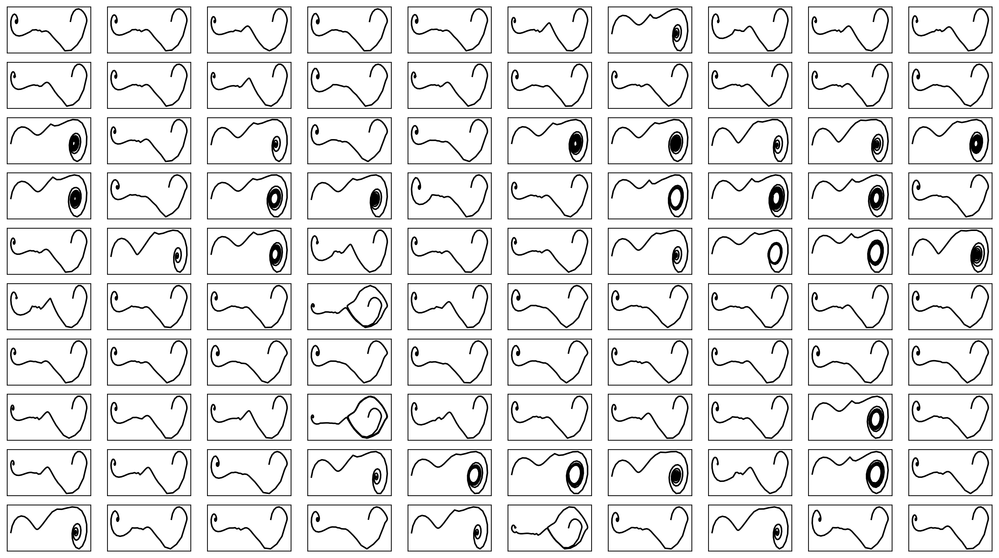

In [34]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter3.png")

In [35]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
# #     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [36]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
# #     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [37]:
# i = 49
# plt.plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1])
# plt.plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
# # plt.plot(simdata1b[i][:,0], simdata1b[i][:,1]) 
# plt.scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()),
#            # vmin=f(min_val), vmax=f(max_val)
#            )
# plt.colorbar()

train_weighted_vae: enc_dec
train: iter 0  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 0
train: iter 1  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 1
train: iter 2  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 2
train: iter 3  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 3
train: iter 4  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 4
train: iter 5  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 5
train: iter 6  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 6
train: iter 7  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 7
train: iter 8  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 8
train: iter 9  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 9
train: iter 10  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 10
train: iter 11  trainloss nan  validloss nan±nan  bestvalidloss inf 

train: iter 98  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 98
train: iter 99  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 99
train: iter 100  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 100
train: fin


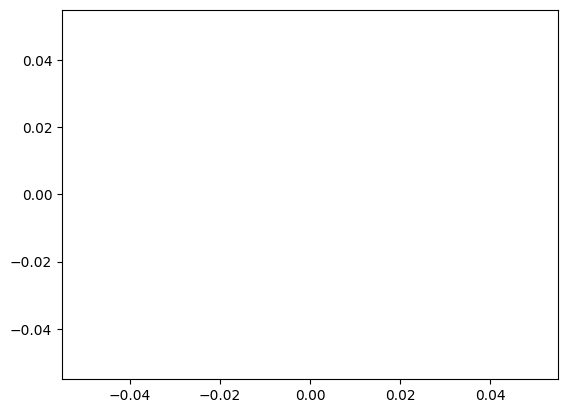

train_weighted_vae: enc
train: iter 0  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 0
train: iter 1  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 1
train: iter 2  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 2
train: iter 3  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 3
train: iter 4  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 4
train: iter 5  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 5
train: iter 6  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 6
train: iter 7  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 7
train: iter 8  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 8
train: iter 9  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 9
train: iter 10  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 10
train: iter 11  trainloss nan  validloss nan±nan  bestvalidloss inf  las

train: iter 98  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 98
train: iter 99  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 99
train: iter 100  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 100
train: fin


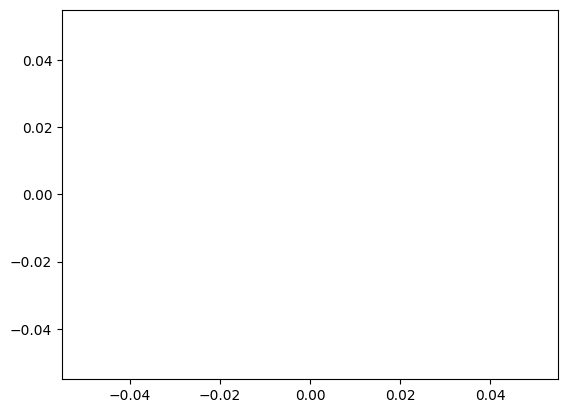

train_weighted_vae: dec
train: iter 0  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 0
train: iter 1  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 1
train: iter 2  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 2
train: iter 3  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 3
train: iter 4  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 4
train: iter 5  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 5
train: iter 6  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 6
train: iter 7  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 7
train: iter 8  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 8
train: iter 9  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 9
train: iter 10  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 10
train: iter 11  trainloss nan  validloss nan±nan  bestvalidloss inf  las

train: iter 98  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 98
train: iter 99  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 99
train: iter 100  trainloss nan  validloss nan±nan  bestvalidloss inf  last_update 100
train: fin


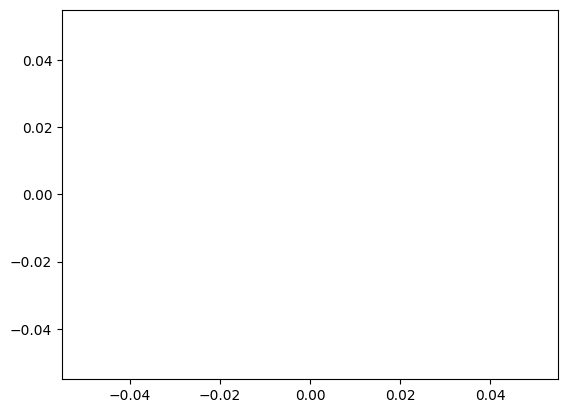

alpha 0.3 vae_lr 0.0005


In [38]:

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()

print("alpha",alpha, "vae_lr", vae_lr)
# plt.ylim([-2000, 1000])

In [ ]:
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
# simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
#     ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter3.png")
plt.savefig(figfilenamehead+"joint_iter3.eps")
# plt.savefig(figfilenamehead+"joint_iter3.pdf")

print("実環境方策rollout vs Sim環境方策rollout")


 0 9.5367431640625e-07
c = 0.27052334256489136

 1 6.304469585418701
c = 0.20490024535070814

 2 6.377950429916382
c = 0.24370600272452098

 3 5.917026996612549
c = 0.29601747489787034

 4 6.490988731384277
c = 0.0039888412612036125

 5 7.0205466747283936
c = 0.2994256035763757

 6 6.591771125793457
c = 0.084589067919582

 7 6.750854730606079
c = 0.23582099196994108

 8 6.5546715259552
c = 0.21852340413122312

 9 6.919531345367432
c = 0.16131695181981118

 10 6.824239492416382
c = 0.1595222214985205

 11 6.755797863006592
c = 0.2251435189744928

 12 7.153958559036255
c = 0.2380834868475175

 13 6.891385555267334
c = 0.13455591844770814

 14 6.5689873695373535
c = 0.1281231684474395

 15 6.298150300979614
c = 0.27498192974964575

 16 6.294010400772095
c = 0.2115396477177798

 17 6.459741592407227
c = 0.18555969255380986

 18 6.836011171340942
c = 0.11359492338355431

 19 6.5552074909210205
c = 0.16930362246567174

 20 7.001805543899536
c = 0.2852593389135044

 21 6.33818507194519
c = 0

In [ ]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter3.png")
plt.savefig(figfilenamehead+"damping_latent_iter3.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter3.pdf")
plt.show()

# plt.figure(figsize=(16,12))
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
# plt.xlim([0.06,0.14])
# plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [ ]:
print(datetime.datetime.now())

# Iter 4

In [ ]:
iwvi.get_sim_rollout_bamdppolicy_data_randomstop()

In [ ]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
# iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)


In [ ]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


In [ ]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter4.png")

In [ ]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
# #     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [ ]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
# #     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [ ]:
# i = 35
# plt.plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1])
# plt.plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
# # plt.plot(simdata1b[i][:,0], simdata1b[i][:,1]) 
# plt.scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()),
#            # vmin=f(min_val), vmax=f(max_val)
#            )
# plt.colorbar()

In [ ]:

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()

print("alpha",alpha, "vae_lr", vae_lr)
# plt.ylim([-2000, 1000])

In [ ]:
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
# simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
#     ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter4.png")
plt.savefig(figfilenamehead+"joint_iter4.eps")
# plt.savefig(figfilenamehead+"joint_iter4.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

In [ ]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter4.png")
plt.savefig(figfilenamehead+"damping_latent_iter4.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter4.pdf")
plt.show()

# plt.figure(figsize=(16,12))
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
# plt.xlim([0.06,0.14])

# plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [ ]:
print(datetime.datetime.now())

# Iter5

In [ ]:
iwvi.get_sim_rollout_bamdppolicy_data_randomstop()

In [ ]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
# iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)

In [ ]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


In [ ]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter5.png")

In [ ]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
# #     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [ ]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
# #     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [ ]:

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()


train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()

print("alpha",alpha, "vae_lr", vae_lr)
# plt.ylim([-2000, 1000])

In [ ]:
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
# simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
#     ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter5.png")
plt.savefig(figfilenamehead+"joint_iter5.eps")
# plt.savefig(figfilenamehead+"joint_iter5.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

In [ ]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter5.png")
plt.savefig(figfilenamehead+"damping_latent_iter5.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter5.pdf")

plt.show()

# plt.figure(figsize=(16,12))
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
# plt.xlim([0.06,0.14])
# plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [ ]:
print(datetime.datetime.now())

# 評価関数計算

In [ ]:
iwvi.get_sim_rollout_bamdppolicy_data_randomstop()

In [ ]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
# iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)

In [ ]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


In [ ]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter6.png")

In [ ]:
train_curve, valid_curve = iwvi.train_initial_belief(num_iter=100000, lr=1e-3, early_stop_step=100)


In [ ]:
print(iwvi.initial_belief)


In [ ]:
iwvi.save(ckpt_key="policy_optimization_iter1")

In [ ]:
loss_array = np.array(loss_list)

In [ ]:
plt.figure(figsize=(16,12))
plt.plot(loss_array[:,0])
plt.xlabel("iteration")
plt.ylabel("loss")
plt.savefig(figfilenamehead+"learning_curve.png")
plt.savefig(figfilenamehead+"learning_curve.eps")
# plt.savefig(figfilenamehead+"policy_evaluartion_learning_curve.pdf")

In [ ]:
normalized_loss_array = np.array(normalized_loss_list)
plt.figure(figsize=(16,12))
plt.plot(normalized_loss_array[:,0])
plt.xlabel("iteration")
plt.ylabel("loss")
plt.savefig(figfilenamehead+"learning_curve_normalized_"+env_str+".png")
plt.savefig(figfilenamehead+"learning_curve_normalized_"+env_str+".eps")